In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import os
from pathlib import Path
from tqdm import tqdm
tqdm.pandas()
import warnings
warnings.filterwarnings('ignore')

Tekstiä

In [ ]:
study_area = gpd.read_file('../data/studyarea.geojson')
mtk_path = Path('../data/mtk/')

# Wrangle and clip topographic databases

## 2005

Topographic database from 2005 is split into map sheets, and each of those contain several `shp` files. Our study is fully covered in four map sheets, `M21O4D`, `M2104C`, `M20O2B` and `M20O2A`. In addition, this dataset is in `EPSG:2393` coordinates so it must be converted to `EPSG:3067`.

In [ ]:
sheets = [s for s in os.listdir(mtk_path/'2005') if os.path.isdir(mtk_path/'2005'/s)]

### Fields

Fields are found on files with template `M<sheetid>P`, and the class id is `32611`.

In [ ]:
fields = None
for s in sheets:
    temp = gpd.read_file(mtk_path/'2005'/s/f'M{s[1:]}P.SHP')
    temp = temp[temp.LUOKKA == 32611]
    if fields is None: fields = temp
    else: fields = pd.concat([fields, temp])

In [ ]:
fields = fields.to_crs('EPSG:3067')
fields = fields.clip(study_area.iloc[0].geometry)

<AxesSubplot: >

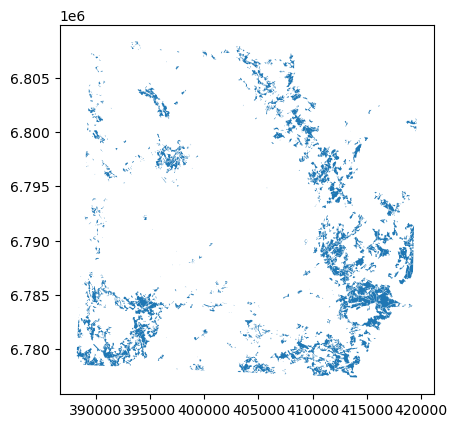

In [ ]:
fields.plot()

In [ ]:
fields.to_file(mtk_path/'2005'/'fields.geojson')

### Roads

Roads are found on files with template `L<sheetid>V`, and the class ids are `12111`, `12112`, `12121`, `12122`, `12131` and `12132`.

In [ ]:
roads = None
for s in sheets:
    temp = gpd.read_file(mtk_path/'2005'/s/f'L{s[1:]}V.SHP')
    temp = temp[temp.LUOKKA.isin([12111,12112,12121,12122,12131,12132])]
    if roads is None: roads = temp
    else: roads = pd.concat([roads, temp])

In [ ]:
roads = roads.to_crs('EPSG:3067')
roads = roads.clip(study_area.iloc[0].geometry)

<AxesSubplot: >

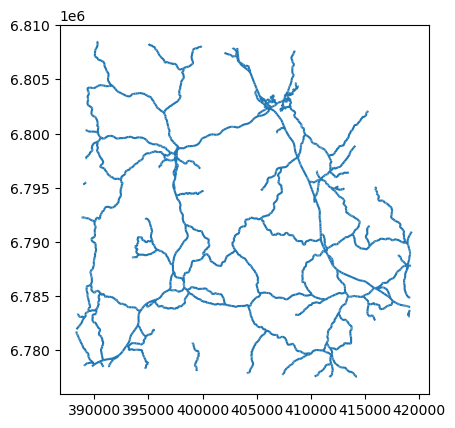

In [ ]:
roads.plot()

In [ ]:
roads.to_file(mtk_path/'2005'/'roads.geojson')

### Mires

Mires are found on files with template `M<sheetid>P`, and the class ids are `35411`, `35412`, `35421` and `35422`.

In [ ]:
mires = None
for s in sheets:
    temp = gpd.read_file(mtk_path/'2005'/s/f'M{s[1:]}P.SHP')
    temp = temp[temp.LUOKKA.isin([35411,35412,35421,35422])]
    if mires is None: mires = temp
    else: mires = pd.concat([mires, temp])

In [ ]:
mires = mires.to_crs('EPSG:3067')
mires = mires.clip(study_area.iloc[0].geometry)

<AxesSubplot: >

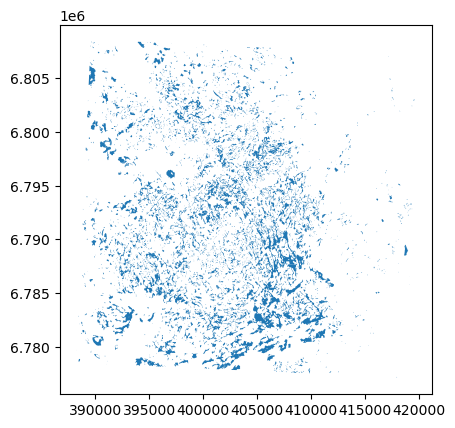

In [ ]:
mires.plot()

In [ ]:
mires.to_file(mtk_path/'2005'/'mires.geojson')

### Watercourses

Watercourses are found from files with template `M<sheetid>V` with class ids `36311` and `36312` as line geometries, and from files with template `M<sheetid>P` with class ids `36313` as polygon data. As our predictions convert all watercourses into line data, we do the same for class `36313`.

In [ ]:
watercourses = None
for s in sheets:
    temp = gpd.read_file(mtk_path/'2005'/s/f'M{s[1:]}V.SHP')
    temp = temp[temp.LUOKKA.isin([36311,36312])]
    if watercourses is None: watercourses = temp
    else: watercourses = pd.concat([watercourses, temp])
watercourses.reset_index(inplace=True, drop=True)

In [ ]:
#|output: false

from centerline.geometry import Centerline

watercoursepolys = None
for s in sheets:
    temp = gpd.read_file(mtk_path/'2005'/s/f'M{s[1:]}P.SHP')
    temp = temp[temp.LUOKKA.isin([36313])]
    if watercoursepolys is None: watercoursepolys = temp
    else: watercoursepolys = pd.concat([watercoursepolys, temp])
watercoursepolys.reset_index(inplace=True, drop=True)
watercoursepolys = watercoursepolys.to_crs('EPSG:3067')
watercoursepolys = watercoursepolys.clip(study_area.iloc[0].geometry)
watercoursepolys['geometry'] = watercoursepolys.progress_apply(lambda row: Centerline(row.geometry), axis=1)

100%|█████████████████████████████████████████████████████████████████████████████████| 42/42 [01:41<00:00,  2.42s/it]


In [ ]:
watercourses = watercourses.to_crs('EPSG:3067')
watercourses = watercourses.clip(study_area.iloc[0].geometry)
watercourses = pd.concat([watercourses, watercoursepolys])
watercourses.reset_index(inplace=True, drop=True)

<AxesSubplot: >

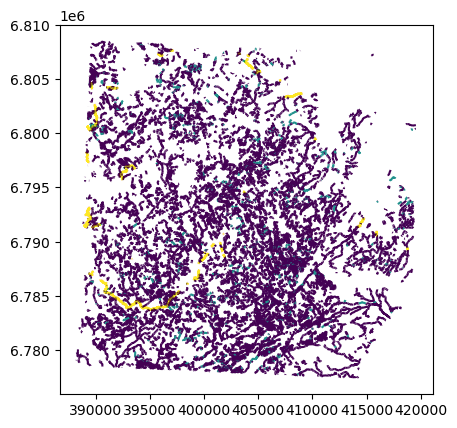

In [ ]:
watercourses.plot(column='LUOKKA')

In [ ]:
watercourses.to_file(mtk_path/'2005'/'watercourses.geojson')

### Water bodies

Water bodies area on files with template `M<sheetid>P`, class ids are `36200`.

In [ ]:
waterbodies = None
for s in sheets:
    temp = gpd.read_file(mtk_path/'2005'/s/f'M{s[1:]}P.SHP')
    temp = temp[temp.LUOKKA.isin([36200])]
    if waterbodies is None: waterbodies = temp
    else: waterbodies = pd.concat([waterbodies, temp])

In [ ]:
waterbodies = waterbodies.to_crs('EPSG:3067')
waterbodies = waterbodies.clip(study_area.iloc[0].geometry)

<AxesSubplot: >

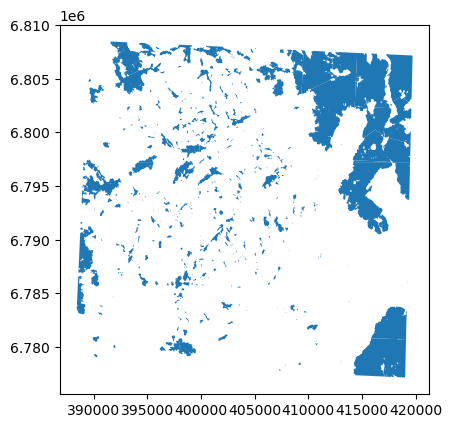

In [ ]:
waterbodies.plot()

In [ ]:
waterbodies.to_file(mtk_path/'2005'/'waterbodies.geojson')

## 2022

Topographic database from 2022 is saved as a single geodatabases for whole Finland, and the databases are:

* MTK-kallio contains rocks and mineral soils
* MTK-korkeussuhteet contains altitude information
* MTK-maastokuvionreuna contains the edges for some classes
* MTK-muut contains the miscillaneous classes, such as meadows and arable land
* MTK-rakennus contains buildings
* MTK-suo contains mires
* MTK-tie contains the road networks
* MTK-vakavesi contains all water bodies
* MTK-virtavesi contains all watercourses

Our analyses require the usage of `MTK-muut`, `MTK-suo`, `MTK-tie`, `MTK-vakavesi` and `MTK-virtavesi`. The class ids are the same as in 2005, and the clipping is done beforehand with QGIS. We just convert watercourse polygons to lines and combine them with watercourse lines.

In [ ]:
#|output: false

lines = gpd.read_file(mtk_path/'2022/virtavesiviivat_2022.geojson')
polys = gpd.read_file(mtk_path/'2022/virtavesialueet_2022.geojson')
polys['geometry'] = polys.geometry.progress_apply(Centerline)
wws = pd.concat([lines, polys])
wws.reset_index(inplace=True, drop=True)
wws.to_file(mtk_path/'2022/virtavedet_2022.geojson')

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [02:50<00:00,  3.47s/it]


# Change analyses

Change analyses can be done with either raster data or polygon data. Working with polygon data is much easier, as newer topographical databases are also polygon data.

In [ ]:
import fiona
from rasterio import features
from rasterio.enums import Resampling
import rasterio as rio

def polygonize(fn, outpath, target_class, scale_factor=1):
    with rio.open(fn) as src:
        im = src.read(out_shape=(src.count, int(src.height*scale_factor),int(src.width*scale_factor)),
                      resampling=Resampling.mode)[target_class -1]
        im[im !=  0] = 1
        mask = im == 1
        tfm = src.transform * src.transform.scale((src.width/im.shape[-1]), (src.height/im.shape[-2]))
        results = ({'properties': {'raster_val': v}, 'geometry': s}
                   for i, (s, v) in enumerate(features.shapes(im, mask==mask, transform=tfm))
                   if v == 1)
        with fiona.open(outpath, 'w', driver='GeoJSON',
                        crs='EPSG:3067',
                        schema={'properties': [('raster_val', 'int')],
                                'geometry': 'Polygon'}) as dst:
            dst.writerecords(results)

Also, as the maps are not perfectly aligned, the analysis is done by aggregating the data into a rectangular grid.

In [ ]:
from itertools import product
from shapely.geometry import Polygon
import numpy as np

def make_grid(area, cell):
    xmin, ymin, xmax, ymax = area.total_bounds
    
    cols = list(np.arange(xmin, xmax+cell, cell))
    rows = list(np.arange(ymin, ymax+cell, cell))
    
    polys = []
    
    for x, y in product(cols[:-1], rows[:-1]):
        polys.append(Polygon([(x,y), (x+cell, y), (x+cell,y+cell),(x, y+cell)]))
    return gpd.GeoDataFrame({'geometry':polys}, crs=area.crs)

In [ ]:
respath = Path('../results/processed/')
results = os.listdir(respath)

## Fields

First polygonize the results.

In [ ]:
polypath = Path('../results/polygons/')
for r in results:
    polygonize(respath/r, polypath/'fields'/r.replace('tif', 'geojson'), target_class=1, scale_factor=1/2)

Then put them into a single dataframe

In [ ]:
fields_65 = None
fields_80s = None

for p in os.listdir(polypath/'fields'):
    union_gdf = gpd.read_file(polypath/'fields'/p)
    if '1965' in p:
        if fields_65 is None: fields_65 = union_gdf
        else: fields_65 = pd.concat((fields_65, union_gdf))
    else:
        if fields_80s is None: fields_80s = union_gdf
        else: fields_80s = pd.concat((fields_80s, union_gdf))
fields_65.reset_index(inplace=True, drop=True)
fields_80s.reset_index(inplace=True, drop=True)

Save the dataframes.

In [ ]:
fields_65.to_file(polypath/'fields_65.geojson')
fields_80s.to_file(polypath/'fields_80s.geojson')

In [ ]:
fields_05 = gpd.read_file(mtk_path/'2005/fields.geojson')
fields_22 = gpd.read_file(mtk_path/'2022/pellot_2022.geojson')

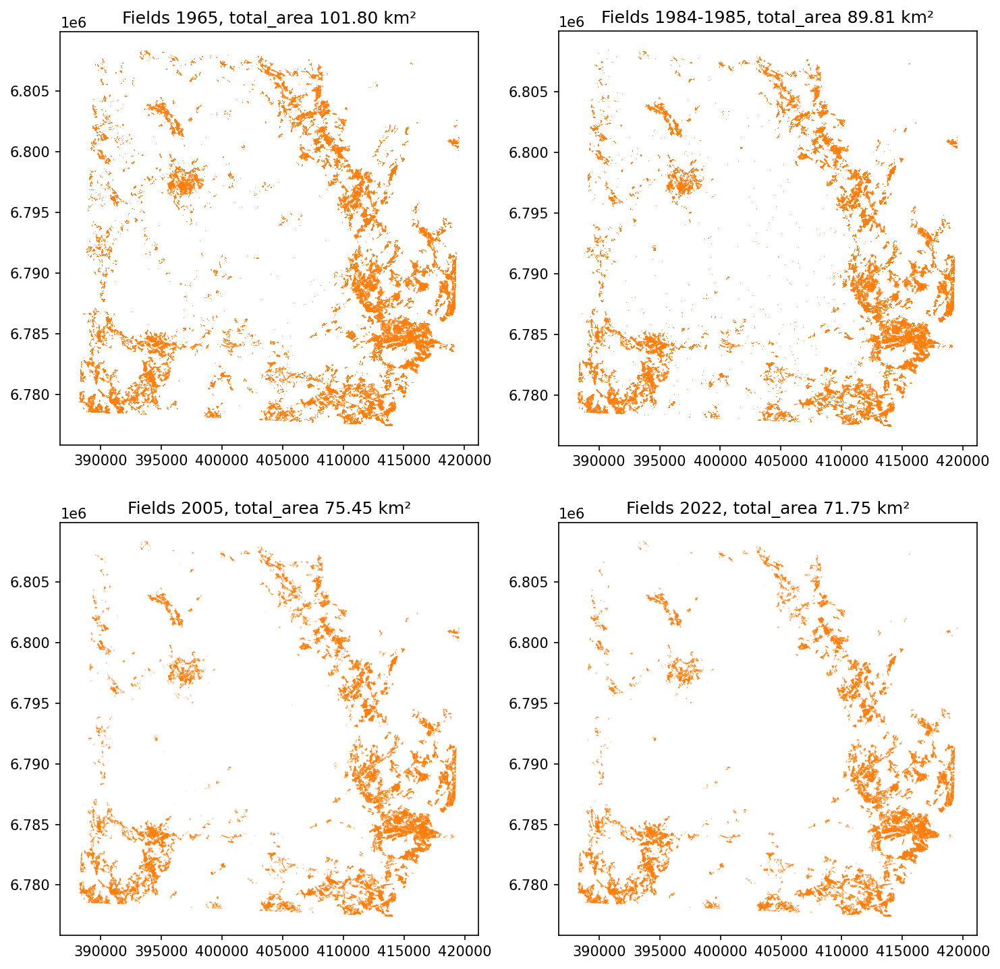

In [ ]:
fig, axs = plt.subplots(2,2, figsize=(10,10), dpi=150)
fields_65.plot(ax=axs[0,0], color='tab:orange')
axs[0,0].set_title(f'Fields 1965, total_area {(fields_65.area.sum() * 10**-6):.2f} km²')
fields_80s.plot(ax=axs[0,1], color='tab:orange')
axs[0,1].set_title(f'Fields 1984-1985, total_area {(fields_80s.area.sum() * 10**-6):.2f} km²')
fields_05.plot(ax=axs[1,0], color='tab:orange')
axs[1,0].set_title(f'Fields 2005, total_area {(fields_05.area.sum() * 10**-6):.2f} km²')
fields_22.plot(ax=axs[1,1], color='tab:orange')
axs[1,1].set_title(f'Fields 2022, total_area {(fields_22.area.sum() * 10**-6):.2f} km²')

plt.tight_layout()

From 1965 to 2022, the total field area has decreased by around 30 km². However, visualizing where the change has been most significant is rather difficult from the polygon data, so we aggregate the data into 500x500m grid.

In [ ]:
grid = make_grid(study_area, 500)

In [ ]:
def get_field_area(cell, fields, sindex):
    "Return the field area in square kilometers within the grid cell. Utilizes spatial index"
    nearest_idx = list(sindex.nearest(cell.geometry.bounds))
    tempdata = fields.iloc[nearest_idx]
    return tempdata.clip(cell.geometry).area.sum() * 10**-6 # convert to square kms

In [ ]:
#|output: false

grid['field_area_65'] = grid.progress_apply(lambda cell: get_field_area(cell, fields_65, fields_65.sindex), axis=1)
grid['field_area_85'] = grid.progress_apply(lambda cell: get_field_area(cell, fields_80s, fields_80s.sindex), axis=1)
grid['field_area_05'] = grid.progress_apply(lambda cell: get_field_area(cell, fields_05, fields_05.sindex), axis=1)
grid['field_area_22'] = grid.progress_apply(lambda cell: get_field_area(cell, fields_22, fields_22.sindex), axis=1)

100%|████████████████████████████████████████████████████████████████████████████| 4032/4032 [00:13<00:00, 293.97it/s]


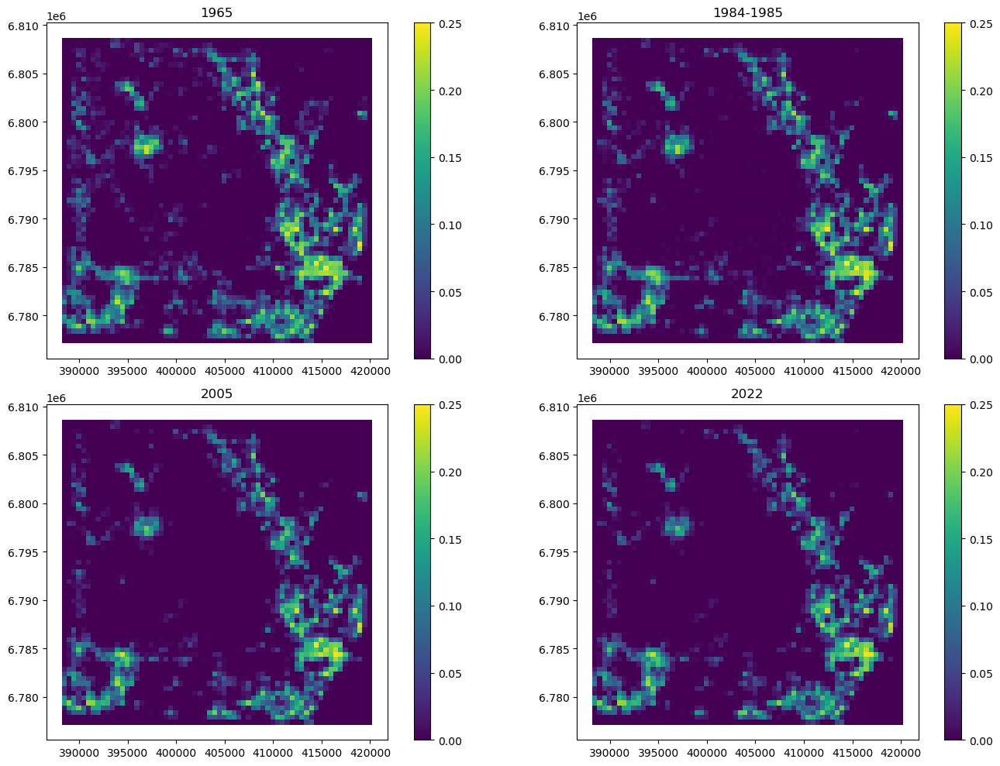

In [ ]:
fig, axs = plt.subplots(2,2, figsize=(14,10))
grid.plot(column='field_area_65', ax=axs[0,0], vmin=0, vmax=.500**2, legend=True).set_title('1965')
grid.plot(column='field_area_85', ax=axs[0,1], vmin=0, vmax=.500**2, legend=True).set_title('1984-1985')
grid.plot(column='field_area_05', ax=axs[1,0], vmin=0, vmax=.500**2, legend=True).set_title('2005')
grid.plot(column='field_area_22', ax=axs[1,1], vmin=0, vmax=.500**2, legend=True).set_title('2022')
plt.tight_layout()

Quantify the change. Negative change means decreased field area.

In [ ]:
grid['field_change_6585'] = (grid.field_area_85 - grid.field_area_65)
grid['field_change_8505'] = (grid.field_area_05 - grid.field_area_85)
grid['field_change_0522'] = (grid.field_area_22 - grid.field_area_05)

Change stats for 1965-1985:

In [ ]:
print(f'Gain: {grid[grid.field_change_6585 > 0].field_change_6585.sum():.2f} km²')
print(f'Loss: {-grid[grid.field_change_6585 < 0].field_change_6585.sum():.2f} km²')
print(f'Change: {grid.field_change_6585.sum():.2f} km²')

Gain: 2.84 km²
Loss: 14.83 km²
Change: -11.99 km²


Change stats for 1985-2005

In [ ]:
print(f'Gain: {grid[grid.field_change_8505 > 0].field_change_8505.sum():.2f} km²')
print(f'Loss: {-grid[grid.field_change_8505 < 0].field_change_8505.sum():.2f} km²')
print(f'Change: {grid.field_change_8505.sum():.2f} km²')

Gain: 1.11 km²
Loss: 15.47 km²
Change: -14.36 km²


Change stats for 2005-2022

In [ ]:
print(f'Gain: {grid[grid.field_change_0522 > 0].field_change_0522.sum():.2f} km²')
print(f'Loss: {-grid[grid.field_change_0522 < 0].field_change_0522.sum():.2f} km²')
print(f'Change: {grid.field_change_0522.sum():.2f} km²')

Gain: 1.81 km²
Loss: 5.51 km²
Change: -3.70 km²


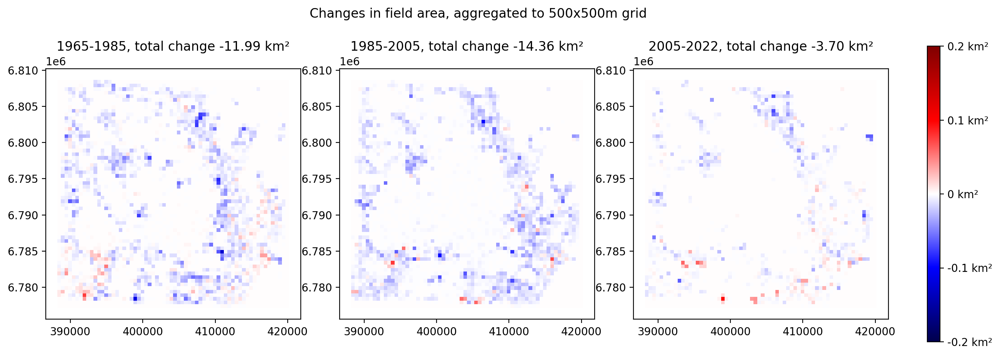

In [ ]:
fig,axs = plt.subplots(1,4, figsize=(15,5), dpi=200, gridspec_kw={'width_ratios': [1,1,1,0.05]})

grid.plot(column='field_change_6585', cmap='seismic', vmin=-.20, vmax=.20, ax=axs[0])
grid.plot(column='field_change_8505', cmap='seismic', vmin=-.20, vmax=.20, ax=axs[1])
grid.plot(column='field_change_0522', cmap='seismic', vmin=-.20, vmax=.20, ax=axs[2])
axs[0].set_title(f'1965-1985, total change {grid.field_change_6585.sum():.2f} km²')
axs[1].set_title(f'1985-2005, total change {grid.field_change_8505.sum():.2f} km²')
axs[2].set_title(f'2005-2022, total change {grid.field_change_0522.sum():.2f} km²')

norm = colors.Normalize(vmin=-.2,vmax=.2)
sm = plt.cm.ScalarMappable(cmap='seismic', norm=norm)
ticks = [-.2,-.1,0,.1,.2]
cbar = plt.colorbar(sm, cax=axs[3], ticks=ticks)
cbar.ax.set_yticklabels([f'{t} km²' for t in ticks])
plt.suptitle('Changes in field area, aggregated to 500x500m grid')
plt.show()

Visualize the location where the field area has decreased the most between 1965 and 1985. For 1965 and 1980s show the corresponding map patch along with the data.

In [ ]:
from shapely.geometry import box
from rasterio.windows import from_bounds

def get_map_patch(bbox, year, map_path):
    "Get map patch to go along with the desired location"
    if year == 1965: files = [f for f in os.listdir(map_path) if '1965' in f]
    else: files = [f for f in os.listdir(map_path) if '1965' not in f]
    for f in files:
        with rio.open(map_path/f) as src:
            tot_bounds = src.bounds
            if not bbox.within(box(*tot_bounds)): continue
            data = src.read(window=from_bounds(*bbox.bounds, src.transform))
    return np.moveaxis(data, 0, 2)

For 2005 and 2022, show the closest aerial image to that year. Unfortunately the closest historical images available are from 1949 and 1979, so we can't really use them for visualizations.

In [ ]:
import owslib.wcs as wcs
import io

def get_wcs_img(bounds, year):
    mml_wcs_url = 'https://beta-karttakuva.maanmittauslaitos.fi/ortokuvat-ja-korkeusmallit/wcs/v1'
    mml_wcs = wcs.WebCoverageService(mml_wcs_url)#, version='2.0.1')
    orig_year = year
    tries = 0
    while True:
        if year < 2009: layer = 'ortokuva_mustavalko'
        else: layer = 'ortokuva_vari'
        img_rgb = mml_wcs.getCoverage(identifier=[layer],
                                      crs='EPSG:3067',
                                      subsets=[('E', bounds[0], bounds[2]), 
                                               ('N', bounds[1], bounds[3]), 
                                               ('time', f'{year}-12-31T00:00:00.000Z')],
                                      format='image/tiff')
        image = io.BytesIO(img_rgb.read())
        with rio.open(image) as src:
            data = src.read()
        if data.max() != data.min(): break
        tries += 1
        year = year - tries if tries%2 == 0 else year + tries
    finalyear = year    
    return np.moveaxis(data, 0, 2), finalyear

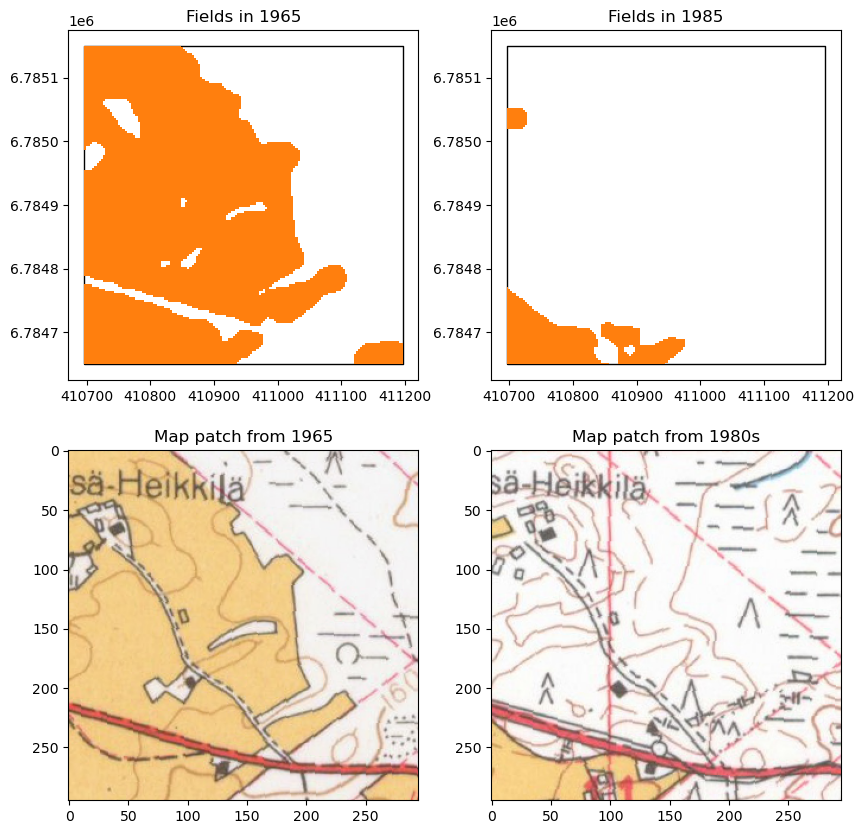

In [ ]:
map_path = Path('../data/maps/aligned_maps/')
fieldloss_6585 = grid[grid.field_change_6585 == grid.field_change_6585.min()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.field_change_6585 == grid.field_change_6585.min()].plot(ax=axs[0,0], facecolor='none')
fields_65.clip(fieldloss_6585).plot(ax=axs[0,0], color='tab:orange').set_title('Fields in 1965')
grid[grid.field_change_6585 == grid.field_change_6585.min()].plot(ax=axs[0,1], facecolor='none')
fields_80s.clip(fieldloss_6585).plot(ax=axs[0,1], color='tab:orange').set_title('Fields in 1985')

img = get_map_patch(fieldloss_6585, 1965, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1965')

img = get_map_patch(fieldloss_6585, 1985, map_path)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Map patch from 1980s')
plt.show()

Same for 1985 and 2005

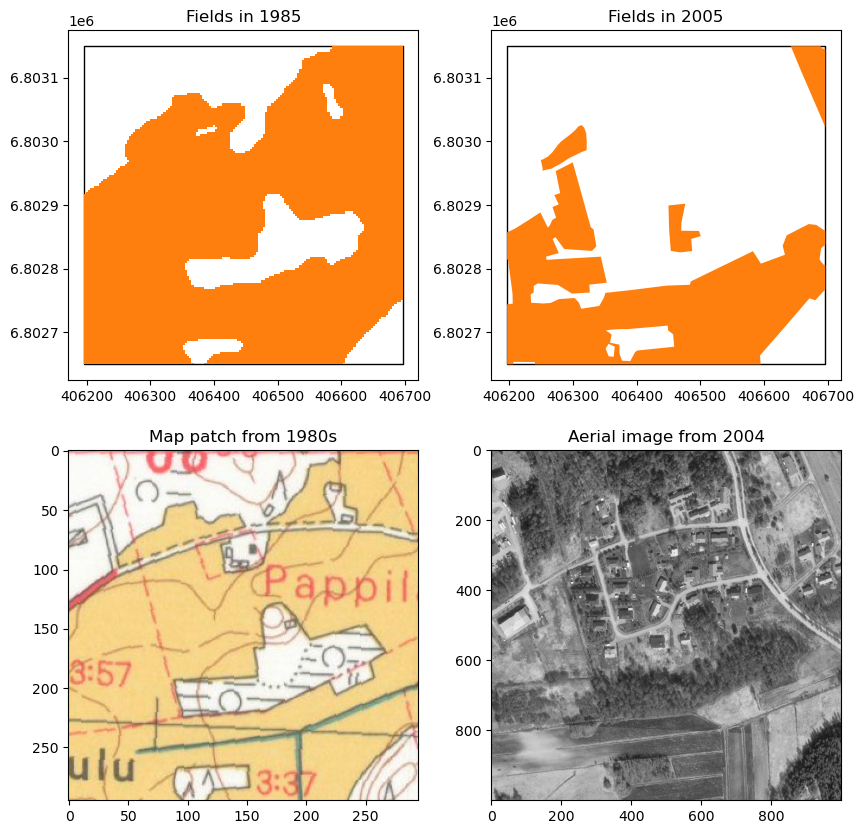

In [ ]:
fieldloss_8505 = grid[grid.field_change_8505 == grid.field_change_8505.min()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.field_change_8505 == grid.field_change_8505.min()].plot(ax=axs[0,0], facecolor='none')
fields_80s.clip(fieldloss_8505).plot(ax=axs[0,0], color='tab:orange').set_title('Fields in 1985')
grid[grid.field_change_8505 == grid.field_change_8505.min()].plot(ax=axs[0,1], facecolor='none')
fields_05.clip(fieldloss_8505).plot(ax=axs[0,1], color='tab:orange').set_title('Fields in 2005')

img = get_map_patch(fieldloss_8505, 1985, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1980s')

img, year = get_wcs_img(fieldloss_8505.bounds, 2005)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Aerial image from {year}')
plt.show()

plt.show()

And then same visualizations for field area increase.

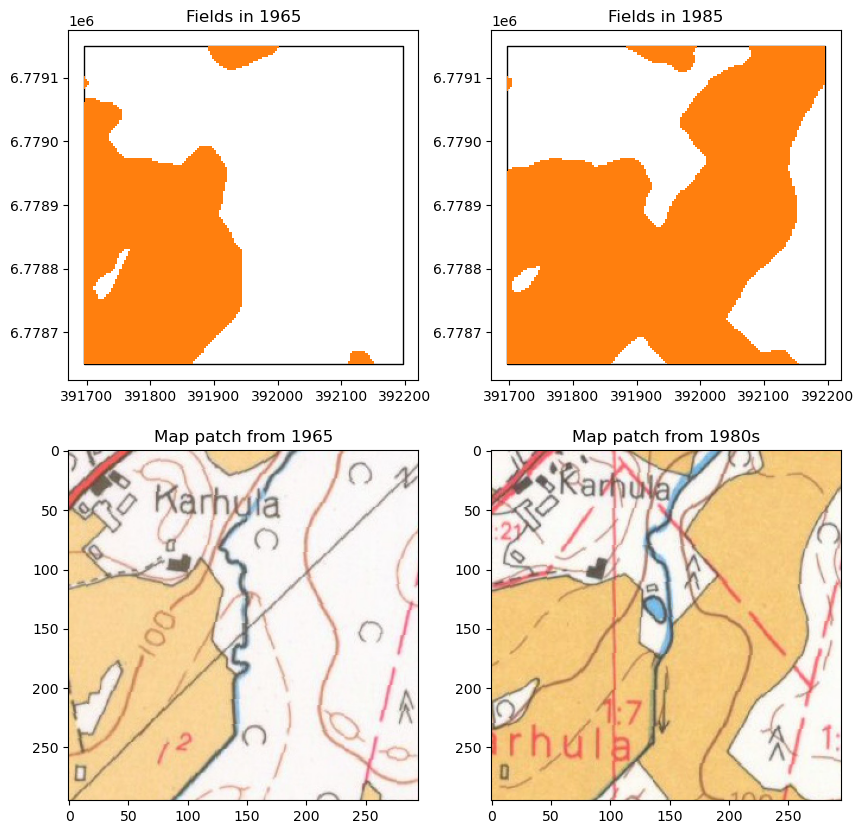

In [ ]:
fieldgain_85 = grid[grid.field_change_6585 == grid.field_change_6585.max()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.field_change_6585 == grid.field_change_6585.max()].plot(ax=axs[0,0], facecolor='none')
fields_65.clip(fieldgain_85).plot(ax=axs[0,0], color='tab:orange').set_title('Fields in 1965')
grid[grid.field_change_6585 == grid.field_change_6585.max()].plot(ax=axs[0,1], facecolor='none')
fields_80s.clip(fieldgain_85).plot(ax=axs[0,1], color='tab:orange').set_title('Fields in 1985')

img = get_map_patch(fieldgain_85, 1965, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1965')

img = get_map_patch(fieldgain_85, 1985, map_path)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Map patch from 1980s')
plt.show()

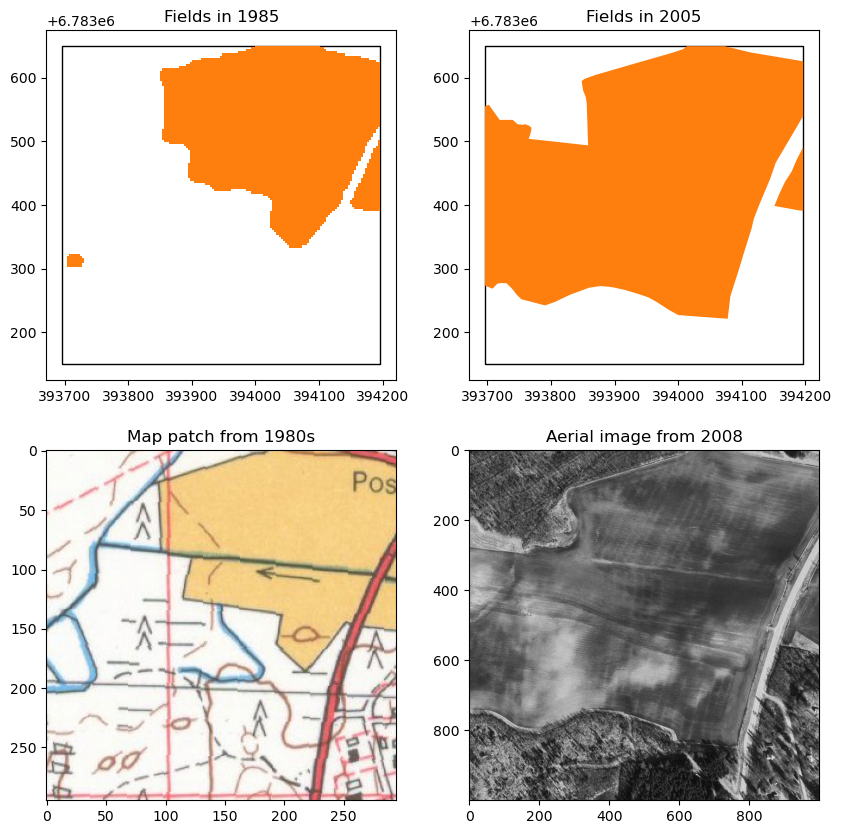

In [ ]:
fieldgain_05 = grid[grid.field_change_8505 == grid.field_change_8505.max()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.field_change_8505 == grid.field_change_8505.max()].plot(ax=axs[0,0], facecolor='none')
fields_80s.clip(fieldgain_05).plot(ax=axs[0,0], color='tab:orange').set_title('Fields in 1985')
grid[grid.field_change_8505 == grid.field_change_8505.max()].plot(ax=axs[0,1], facecolor='none')
fields_05.clip(fieldgain_05).plot(ax=axs[0,1], color='tab:orange').set_title('Fields in 2005')

img = get_map_patch(fieldgain_05, 1985, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1980s')

img, year = get_wcs_img(fieldgain_05.bounds, 2005)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Aerial image from {year}')
plt.show()

plt.show()

## Roads

In [ ]:
road_path = Path('../results/lines/roads/')

roads_65 = None
roads_80s = None

for p in os.listdir(road_path):
    union_gdf = gpd.read_file(road_path/p)
    if '1965' in p:
        if roads_65 is None: roads_65 = union_gdf
        else: roads_65 = pd.concat((roads_65, union_gdf))
    else:
        if roads_80s is None: roads_80s = union_gdf
        else: roads_80s = pd.concat((roads_80s, union_gdf))

roads_65 = roads_65[roads_65.geometry.length > 100]
roads_80s = roads_80s[roads_80s.geometry.length > 100]       

roads_65.reset_index(drop=True, inplace=True)
roads_80s.reset_index(drop=True, inplace=True)

roads_05 = gpd.read_file(mtk_path/'2005/roads.geojson')
roads_22 = gpd.read_file(mtk_path/'2022/tiet_2022.geojson')
roads_22 = roads_22[roads_22.kohdeluokka.isin([12111,12112,12121,12122,12131,12132])]

For roads, we can see the overall change in the road networks and approximate total length.

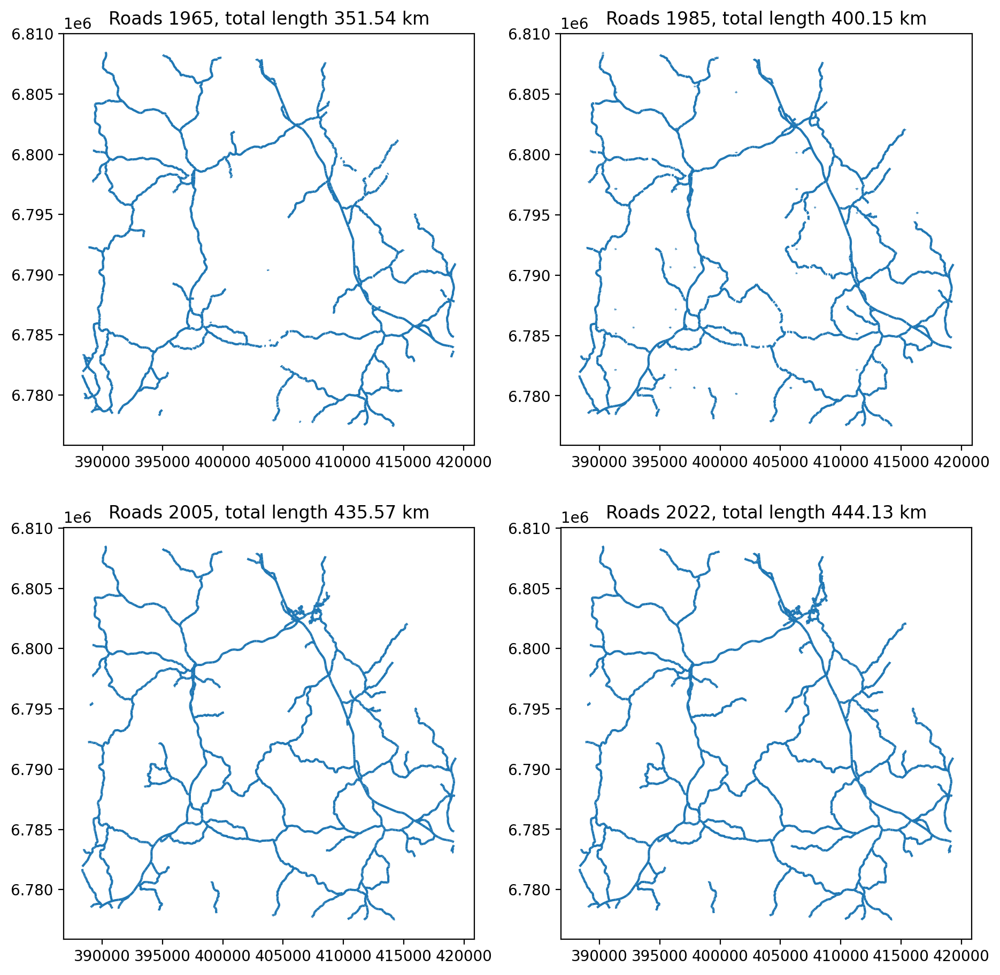

In [ ]:
fig, axs = plt.subplots(2,2, dpi=200, figsize=(11,11))

roads_65.plot(ax=axs[0,0])
roads_80s.plot(ax=axs[0,1])
roads_05.plot(ax=axs[1,0])
roads_22.plot(ax=axs[1,1])
axs[0,0].set_title(f'Roads 1965, total length {roads_65.length.sum() * 10**-3:.2f} km')
axs[0,1].set_title(f'Roads 1985, total length {roads_80s.length.sum() * 10**-3:.2f} km')
axs[1,0].set_title(f'Roads 2005, total length {roads_05.length.sum() * 10**-3:.2f} km')
axs[1,1].set_title(f'Roads 2022, total length {roads_22.length.sum() * 10**-3:.2f} km')
plt.show()

In [ ]:
def get_len(cell, targs, sindex):
    nearest_idx = list(sindex.nearest(cell.geometry.bounds))
    tempdata = targs.iloc[nearest_idx]
    return tempdata.clip(cell.geometry).length.sum() * 10**-3

In [ ]:
#|output: false

grid['road_length_65'] = grid.progress_apply(lambda cell: get_len(cell, roads_65, roads_65.sindex), axis=1)
grid['road_length_85'] = grid.progress_apply(lambda cell: get_len(cell, roads_80s, roads_80s.sindex), axis=1)
grid['road_length_05'] = grid.progress_apply(lambda cell: get_len(cell, roads_05, roads_05.sindex), axis=1)
grid['road_length_22'] = grid.progress_apply(lambda cell: get_len(cell, roads_22, roads_22.sindex), axis=1)

100%|████████████████████████████████████████████████████████████████████████████| 4032/4032 [00:12<00:00, 325.36it/s]


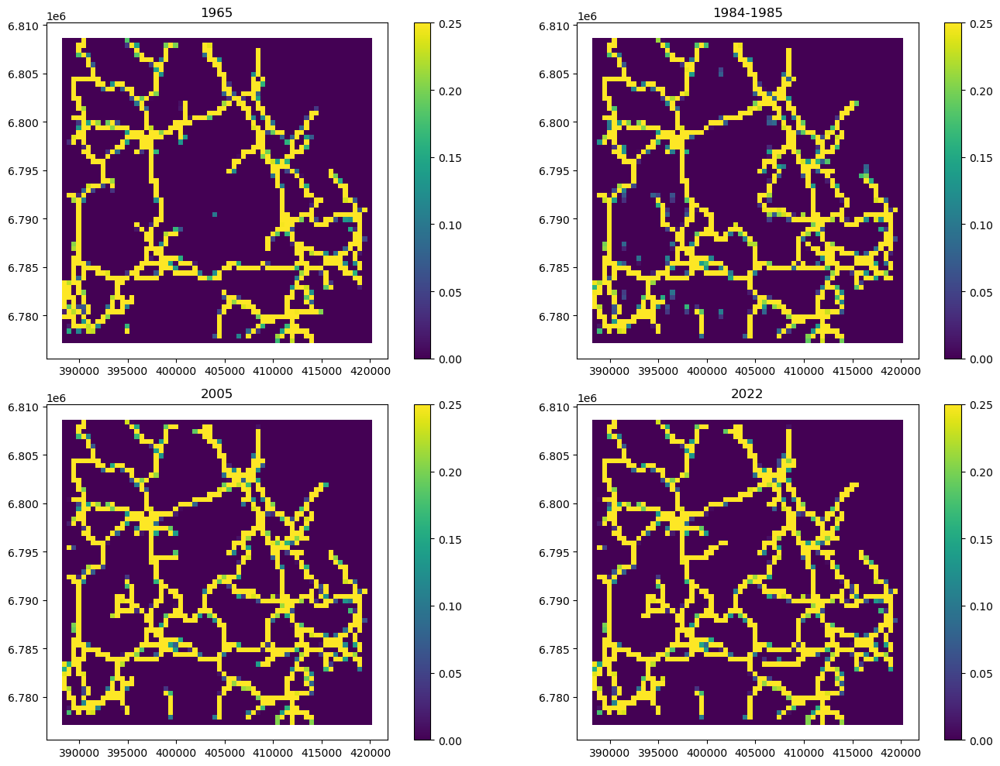

In [ ]:
fig, axs = plt.subplots(2,2, figsize=(14,10))
grid.plot(column='road_length_65', ax=axs[0,0], vmin=0, vmax=.500**2, legend=True).set_title('1965')
grid.plot(column='road_length_85', ax=axs[0,1], vmin=0, vmax=.500**2, legend=True).set_title('1984-1985')
grid.plot(column='road_length_05', ax=axs[1,0], vmin=0, vmax=.500**2, legend=True).set_title('2005')
grid.plot(column='road_length_22', ax=axs[1,1], vmin=0, vmax=.500**2, legend=True).set_title('2022')
plt.tight_layout()

Quantify the change. Negative change means decreased road area.

In [ ]:
grid['road_change_6585'] = (grid.road_length_85 - grid.road_length_65)
grid['road_change_8505'] = (grid.road_length_05 - grid.road_length_85)
grid['road_change_0522'] = (grid.road_length_22 - grid.road_length_05)

Change stats for 1965-1985:

In [ ]:
print(f'Gain: {grid[grid.road_change_6585 > 0].road_change_6585.sum():.2f} km')
print(f'Loss: {-grid[grid.road_change_6585 < 0].road_change_6585.sum():.2f} km')
print(f'Change: {grid.road_change_6585.sum():.2f} km')

Gain: 78.33 km
Loss: 29.71 km
Change: 48.61 km


Change stats for 1985-2005

In [ ]:
print(f'Gain: {grid[grid.road_change_8505 > 0].road_change_8505.sum():.2f} km')
print(f'Loss: {-grid[grid.road_change_8505 < 0].road_change_8505.sum():.2f} km')
print(f'Change: {grid.road_change_8505.sum():.2f} km')

Gain: 52.90 km
Loss: 17.48 km
Change: 35.42 km


Change stats for 2005-2022

In [ ]:
print(f'Gain: {grid[grid.road_change_0522 > 0].road_change_0522.sum():.2f} km')
print(f'Loss: {-grid[grid.road_change_0522 < 0].road_change_0522.sum():.2f} km')
print(f'Change: {grid.road_change_0522.sum():.2f} km')

Gain: 12.79 km
Loss: 4.24 km
Change: 8.56 km


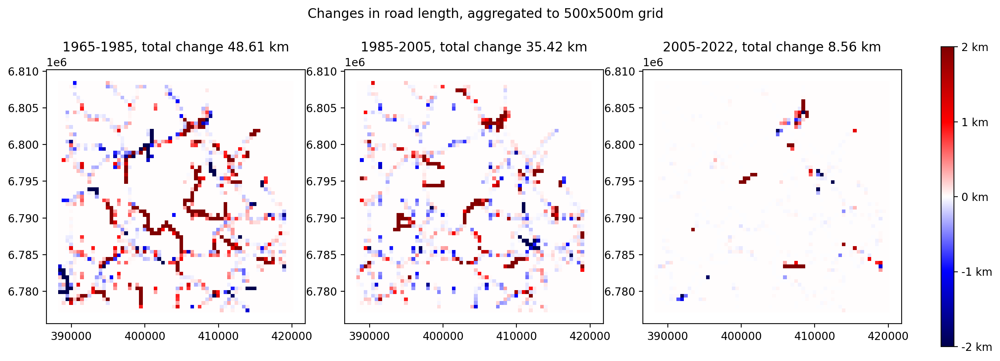

In [ ]:
fig,axs = plt.subplots(1,4, figsize=(15,5), dpi=200, gridspec_kw={'width_ratios': [1,1,1,0.05]})

grid.plot(column='road_change_6585', cmap='seismic', vmin=-.20, vmax=.20, ax=axs[0])
grid.plot(column='road_change_8505', cmap='seismic', vmin=-.20, vmax=.20, ax=axs[1])
grid.plot(column='road_change_0522', cmap='seismic', vmin=-.20, vmax=.20, ax=axs[2])
axs[0].set_title(f'1965-1985, total change {grid.road_change_6585.sum():.2f} km')
axs[1].set_title(f'1985-2005, total change {grid.road_change_8505.sum():.2f} km')
axs[2].set_title(f'2005-2022, total change {grid.road_change_0522.sum():.2f} km')

norm = colors.Normalize(vmin=-2,vmax=2)
sm = plt.cm.ScalarMappable(cmap='seismic', norm=norm)
ticks = [-2,-1,0,1,2]
cbar = plt.colorbar(sm, cax=axs[3], ticks=ticks)
cbar.ax.set_yticklabels([f'{t} km' for t in ticks])
plt.suptitle('Changes in road length, aggregated to 500x500m grid')
plt.show()

## Mires

Polygonize and put to single `geojson` files.

In [ ]:
for r in results:
    polygonize(respath/r, polypath/'mires'/r.replace('tif', 'geojson'), target_class=2, scale_factor=1/2)

In [ ]:
mires_65 = None
mires_80s = None

for p in os.listdir(polypath/'mires'):
    union_gdf = gpd.read_file(polypath/'mires'/p)
    if '1965' in p:
        if mires_65 is None: mires_65 = union_gdf
        else: mires_65 = pd.concat((mires_65, union_gdf))
    else:
        if mires_80s is None: mires_80s = union_gdf
        else: mires_80s = pd.concat((mires_80s, union_gdf))
mires_65.reset_index(inplace=True, drop=True)
mires_80s.reset_index(inplace=True, drop=True)

In [ ]:
mires_65.to_file(polypath/'mires_65.geojson')
mires_80s.to_file(polypath/'mires_80s.geojson')

In [ ]:
mires_05 = gpd.read_file(mtk_path/'2005/mires.geojson')
mires_22 = gpd.read_file(mtk_path/'2022/suot_2022.geojson')

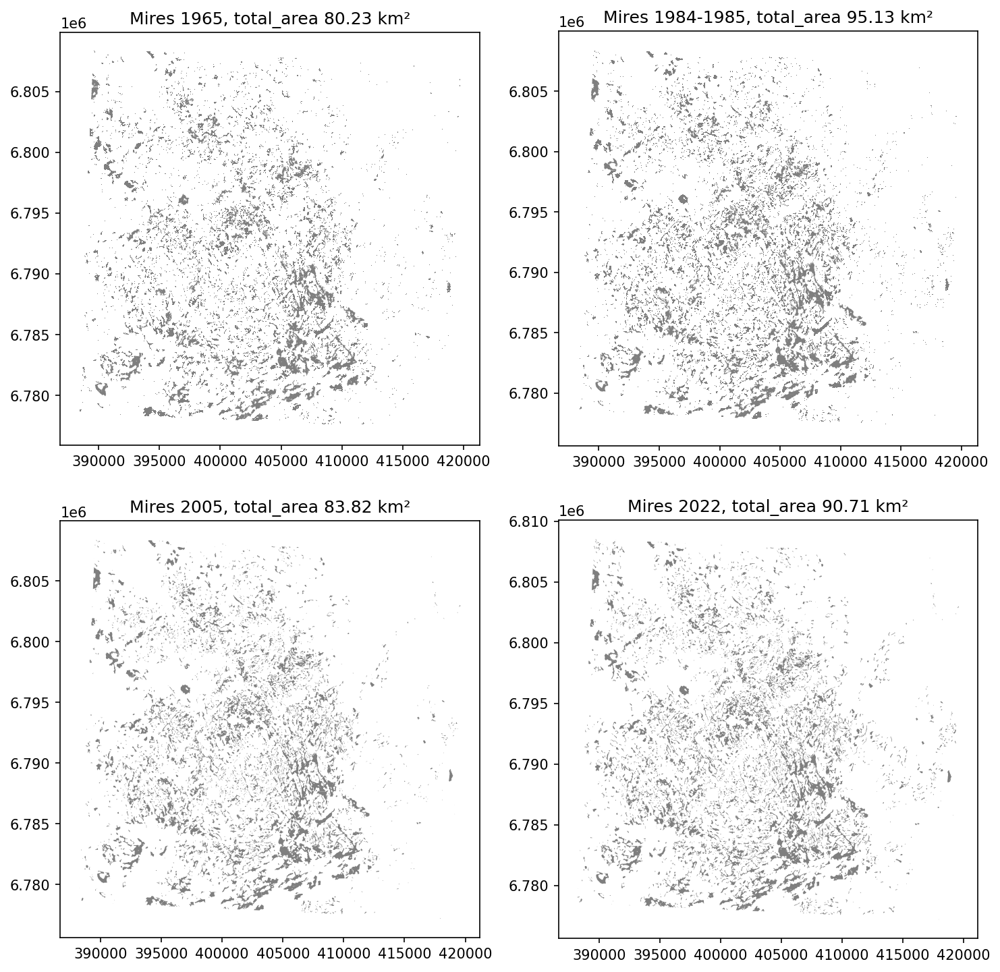

In [ ]:
fig, axs = plt.subplots(2,2, figsize=(10,10), dpi=150)
mires_65.plot(ax=axs[0,0], color='tab:gray')
axs[0,0].set_title(f'Mires 1965, total_area {(mires_65.area.sum() * 10**-6):.2f} km²')
mires_80s.plot(ax=axs[0,1], color='tab:gray')
axs[0,1].set_title(f'Mires 1984-1985, total_area {(mires_80s.area.sum() * 10**-6):.2f} km²')
mires_05.plot(ax=axs[1,0], color='tab:gray')
axs[1,0].set_title(f'Mires 2005, total_area {(mires_05.area.sum() * 10**-6):.2f} km²')
mires_22.plot(ax=axs[1,1], color='tab:gray')
axs[1,1].set_title(f'Mires 2022, total_area {(mires_22.area.sum() * 10**-6):.2f} km²')

plt.tight_layout()

The difference between the total areas of mires between years can be explained by more accurate mapping methods, or restoration processes.

Put the data into the grid.

In [ ]:
#|output: false

grid['mire_area_65'] = grid.progress_apply(lambda cell: get_field_area(cell, mires_65, mires_65.sindex), axis=1)
grid['mire_area_85'] = grid.progress_apply(lambda cell: get_field_area(cell, mires_80s, mires_80s.sindex), axis=1)
grid['mire_area_05'] = grid.progress_apply(lambda cell: get_field_area(cell, mires_05, mires_05.sindex), axis=1)
grid['mire_area_22'] = grid.progress_apply(lambda cell: get_field_area(cell, mires_22, mires_22.sindex), axis=1)

100%|████████████████████████████████████████████████████████████████████████████| 4032/4032 [00:17<00:00, 228.08it/s]


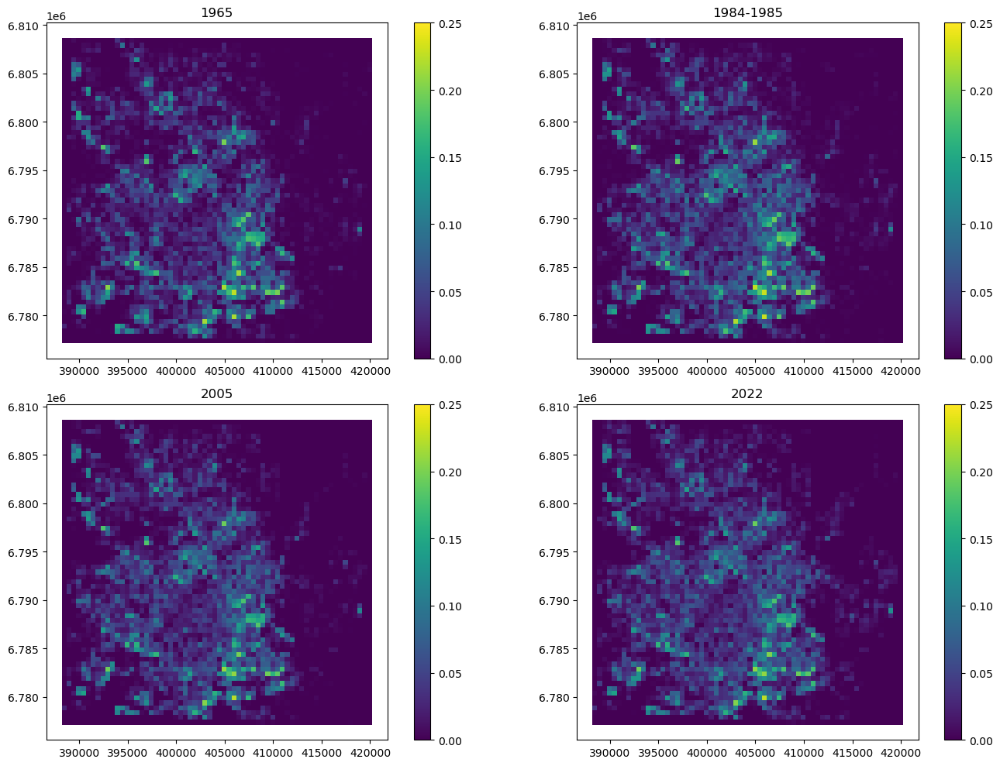

In [ ]:
fig, axs = plt.subplots(2,2, figsize=(14,10))
grid.plot(column='mire_area_65', ax=axs[0,0], vmin=0, vmax=.500**2, legend=True).set_title('1965')
grid.plot(column='mire_area_85', ax=axs[0,1], vmin=0, vmax=.500**2, legend=True).set_title('1984-1985')
grid.plot(column='mire_area_05', ax=axs[1,0], vmin=0, vmax=.500**2, legend=True).set_title('2005')
grid.plot(column='mire_area_22', ax=axs[1,1], vmin=0, vmax=.500**2, legend=True).set_title('2022')
plt.tight_layout()

Quantify the change. Negative change means decreased mire area.

In [ ]:
grid['mire_change_6585'] = (grid.mire_area_85 - grid.mire_area_65)
grid['mire_change_8505'] = (grid.mire_area_05 - grid.mire_area_85)
grid['mire_change_0522'] = (grid.mire_area_22 - grid.mire_area_05)

Change stats for 1965-1985:

In [ ]:
print(f'Gain: {grid[grid.mire_change_6585 > 0].mire_change_6585.sum():.2f} km²')
print(f'Loss: {-grid[grid.mire_change_6585 < 0].mire_change_6585.sum():.2f} km²')
print(f'Change: {grid.mire_change_6585.sum():.2f} km²')

Gain: 19.59 km²
Loss: 4.69 km²
Change: 14.90 km²


Change stats for 1985-2005

In [ ]:
print(f'Gain: {grid[grid.mire_change_8505 > 0].mire_change_8505.sum():.2f} km²')
print(f'Loss: {-grid[grid.mire_change_8505 < 0].mire_change_8505.sum():.2f} km²')
print(f'Change: {grid.mire_change_8505.sum():.2f} km²')

Gain: 1.19 km²
Loss: 12.50 km²
Change: -11.32 km²


Change stats for 2005-2022

In [ ]:
print(f'Gain: {grid[grid.mire_change_0522 > 0].mire_change_0522.sum():.2f} km²')
print(f'Loss: {-grid[grid.mire_change_0522 < 0].mire_change_0522.sum():.2f} km²')
print(f'Change: {grid.mire_change_0522.sum():.2f} km²')

Gain: 8.04 km²
Loss: 1.14 km²
Change: 6.89 km²


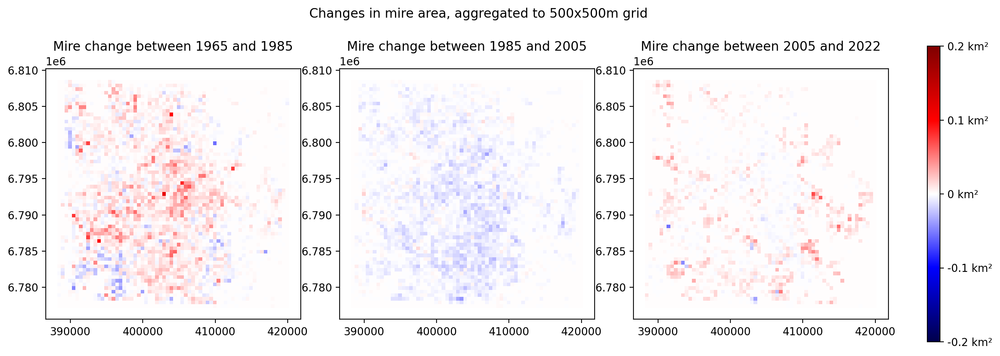

In [ ]:
fig,axs = plt.subplots(1,4, figsize=(15,5), dpi=200, gridspec_kw={'width_ratios': [1,1,1,0.05]})

grid.plot(column='mire_change_6585', cmap='seismic', vmin=-.20, vmax=.20, ax=axs[0]
               ).set_title('Mire change between 1965 and 1985')
grid.plot(column='mire_change_8505', cmap='seismic', vmin=-.20, vmax=.20, ax=axs[1]
               ).set_title('Mire change between 1985 and 2005')
grid.plot(column='mire_change_0522', cmap='seismic', vmin=-.20, vmax=.20, ax=axs[2]
               ).set_title('Mire change between 2005 and 2022')

norm = colors.Normalize(vmin=-.2,vmax=.2)
sm = plt.cm.ScalarMappable(cmap='seismic', norm=norm)
ticks = [-.2,-.1,0,.1,.2]
cbar = plt.colorbar(sm, cax=axs[3], ticks=ticks)
cbar.ax.set_yticklabels([f'{t} km²' for t in ticks])
plt.suptitle('Changes in mire area, aggregated to 500x500m grid')
plt.show()

Visualize the location where the mire area has decreased the most between 1965 and 1985. For 1965 and 1980s show the corresponding map patch along with the data.

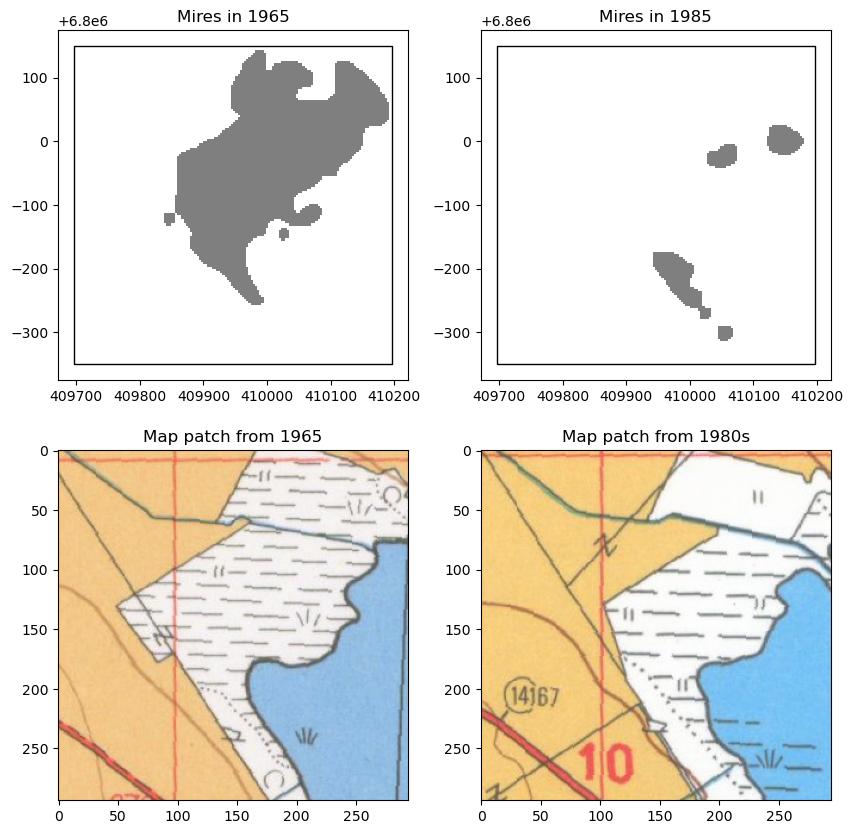

In [ ]:
map_path = Path('../data/maps/aligned_maps/')
mireloss_85 = grid[grid.mire_change_6585 == grid.mire_change_6585.min()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.mire_change_6585 == grid.mire_change_6585.min()].plot(ax=axs[0,0], facecolor='none')
mires_65.clip(mireloss_85).plot(ax=axs[0,0], color='tab:gray').set_title('Mires in 1965')
grid[grid.mire_change_6585 == grid.mire_change_6585.min()].plot(ax=axs[0,1], facecolor='none')
mires_80s.clip(mireloss_85).plot(ax=axs[0,1], color='tab:gray').set_title('Mires in 1985')

img = get_map_patch(mireloss_85, 1965, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1965')

img = get_map_patch(mireloss_85, 1985, map_path)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Map patch from 1980s')
plt.show()

Same for 1985 and 2005

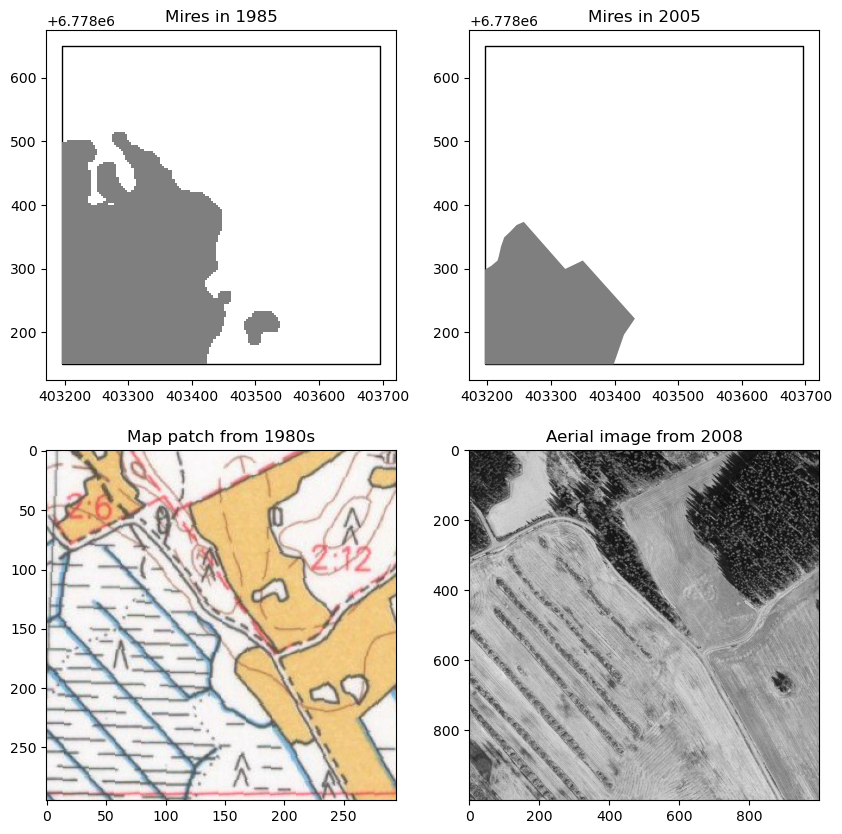

In [ ]:
mireloss_05 = grid[grid.mire_change_8505 == grid.mire_change_8505.min()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.mire_change_8505 == grid.mire_change_8505.min()].plot(ax=axs[0,0], facecolor='none')
mires_80s.clip(mireloss_05).plot(ax=axs[0,0], color='tab:gray').set_title('Mires in 1985')
grid[grid.mire_change_8505 == grid.mire_change_8505.min()].plot(ax=axs[0,1], facecolor='none')
mires_05.clip(mireloss_05).plot(ax=axs[0,1], color='tab:gray').set_title('Mires in 2005')

img = get_map_patch(mireloss_05, 1985, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1980s')

img, year = get_wcs_img(mireloss_05.bounds, 2005)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Aerial image from {year}')
plt.show()

plt.show()

And then same visualizations for mire area increase.

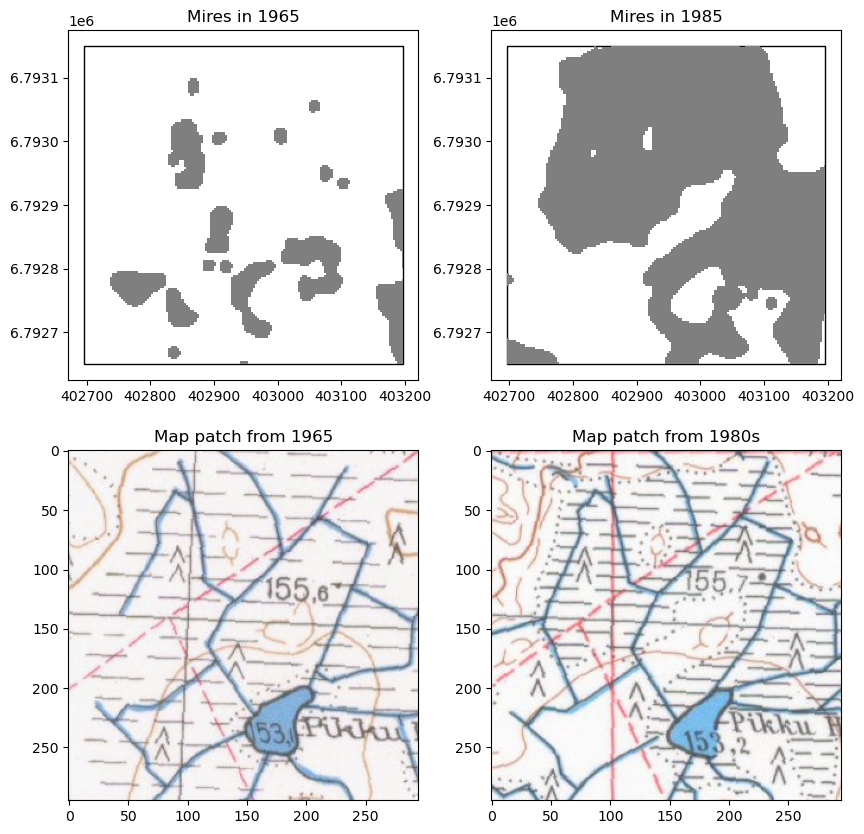

In [ ]:
miregain_85 = grid[grid.mire_change_6585 == grid.mire_change_6585.max()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.mire_change_6585 == grid.mire_change_6585.max()].plot(ax=axs[0,0], facecolor='none')
mires_65.clip(miregain_85).plot(ax=axs[0,0], color='tab:gray').set_title('Mires in 1965')
grid[grid.mire_change_6585 == grid.mire_change_6585.max()].plot(ax=axs[0,1], facecolor='none')
mires_80s.clip(miregain_85).plot(ax=axs[0,1], color='tab:gray').set_title('Mires in 1985')

img = get_map_patch(miregain_85, 1965, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1965')

img = get_map_patch(miregain_85, 1985, map_path)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Map patch from 1980s')
plt.show()

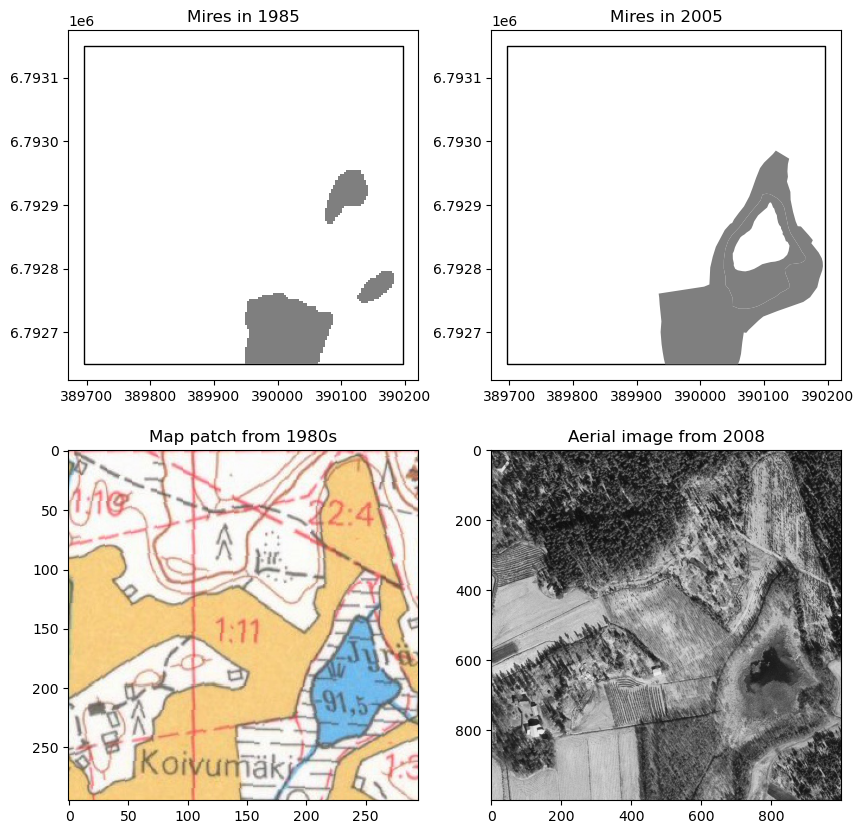

In [ ]:
miregain_05 = grid[grid.mire_change_8505 == grid.mire_change_8505.max()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.mire_change_8505 == grid.mire_change_8505.max()].plot(ax=axs[0,0], facecolor='none')
mires_80s.clip(miregain_05).plot(ax=axs[0,0], color='tab:gray').set_title('Mires in 1985')
grid[grid.mire_change_8505 == grid.mire_change_8505.max()].plot(ax=axs[0,1], facecolor='none')
mires_05.clip(miregain_05).plot(ax=axs[0,1], color='tab:gray').set_title('Mires in 2005')

img = get_map_patch(miregain_05, 1985, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1980s')

img, year = get_wcs_img(miregain_05.bounds, 2005)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Aerial image from {year}')
plt.show()

plt.show()

## Watercourses

In [ ]:
ww_path = Path('../results/lines/watercourses/')

watercourses_65 = None
watercourses_80s = None

for p in os.listdir(ww_path):
    union_gdf = gpd.read_file(ww_path/p)
    if '1965' in p:
        if watercourses_65 is None: watercourses_65 = union_gdf
        else: watercourses_65 = pd.concat((watercourses_65, union_gdf))
    else:
        if watercourses_80s is None: watercourses_80s = union_gdf
        else: watercourses_80s = pd.concat((watercourses_80s, union_gdf))
watercourses_65.reset_index(drop=True, inplace=True)
watercourses_80s.reset_index(drop=True, inplace=True)

watercourses_05 = gpd.read_file(mtk_path/'2005/watercourses.geojson')
watercourses_22 = gpd.read_file(mtk_path/'2022/virtavedet_2022.geojson')

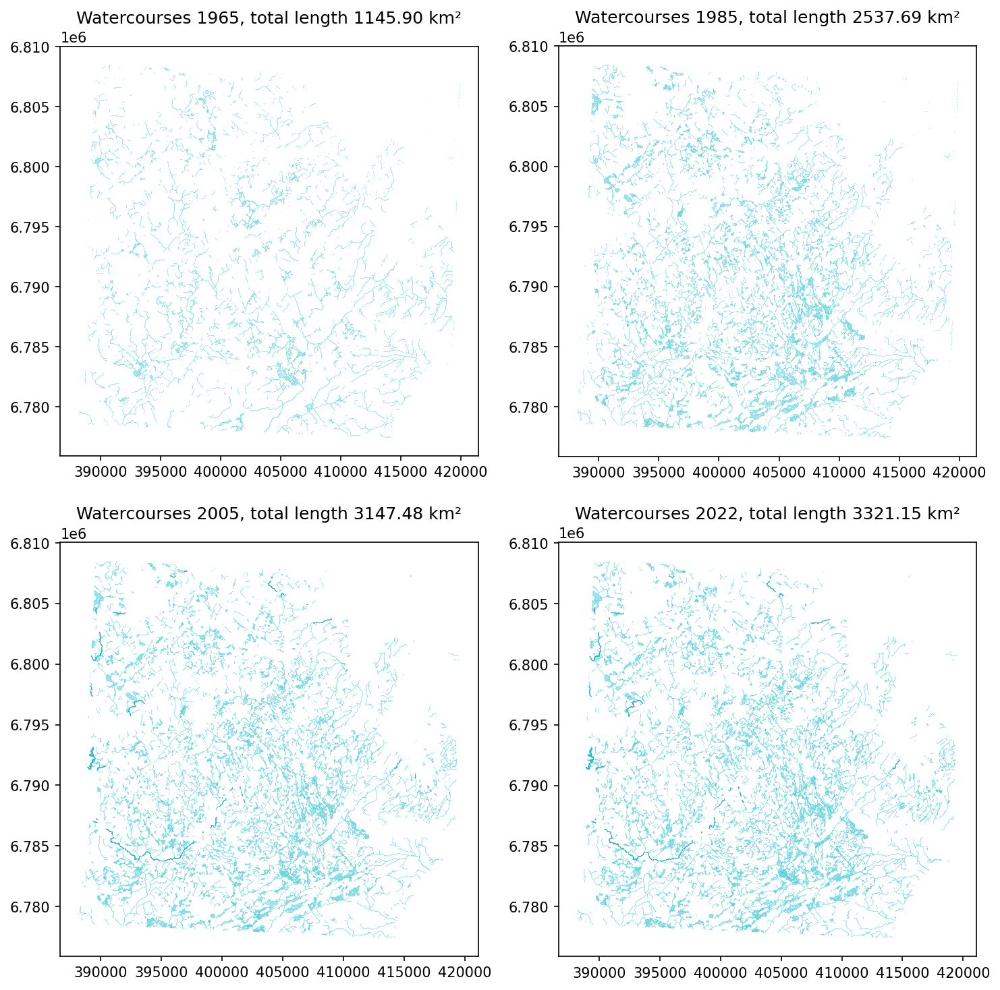

In [ ]:
fig, axs = plt.subplots(2,2, figsize=(10,10), dpi=150)
watercourses_65.plot(ax=axs[0,0], color='tab:cyan', linewidth=.2)
axs[0,0].set_title(f'Watercourses 1965, total length {(watercourses_65.length.sum() * 10**-3):.2f} km²')
watercourses_80s.plot(ax=axs[0,1], color='tab:cyan', linewidth=.2)
axs[0,1].set_title(f'Watercourses 1985, total length {(watercourses_80s.length.sum() * 10**-3):.2f} km²')
watercourses_05.plot(ax=axs[1,0], color='tab:cyan', linewidth=.2)
axs[1,0].set_title(f'Watercourses 2005, total length {(watercourses_05.length.sum() * 10**-3):.2f} km²')
watercourses_22.plot(ax=axs[1,1], color='tab:cyan', linewidth=.2)
axs[1,1].set_title(f'Watercourses 2022, total length {(watercourses_22.length.sum() * 10**-3):.2f} km²')

plt.tight_layout()

Again, to make finding the ditching hotspots easier, aggregate the data into 500x500m grid.

In [ ]:
#|output: false

grid['watercourse_length_65'] = grid.progress_apply(lambda cell: get_len(cell, watercourses_65, watercourses_65.sindex), axis=1)
grid['watercourse_length_85'] = grid.progress_apply(lambda cell: get_len(cell, watercourses_80s, watercourses_80s.sindex), axis=1)
grid['watercourse_length_05'] = grid.progress_apply(lambda cell: get_len(cell, watercourses_05, watercourses_05.sindex), axis=1)
grid['watercourse_length_22'] = grid.progress_apply(lambda cell: get_len(cell, watercourses_22, watercourses_22.sindex), axis=1)

100%|████████████████████████████████████████████████████████████████████████████| 4032/4032 [00:31<00:00, 128.03it/s]


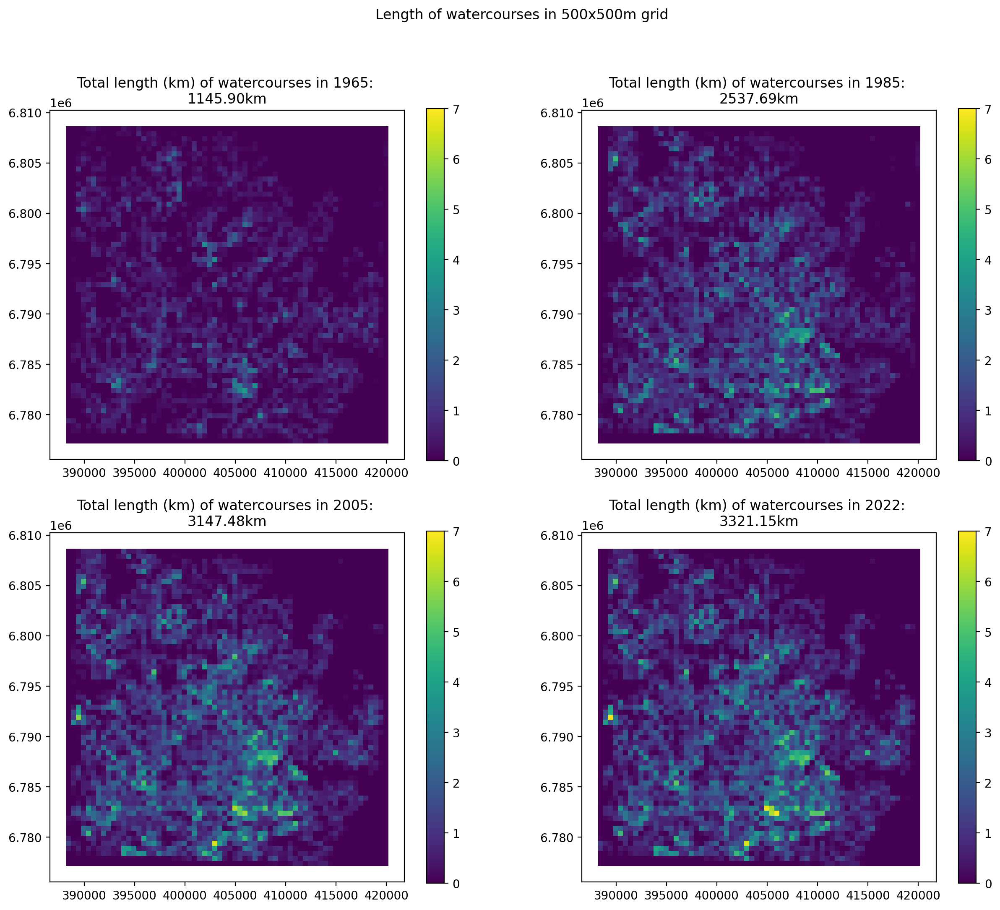

In [ ]:
fig, axs = plt.subplots(2,2, figsize=(15,12), dpi=200)
grid.plot(column='watercourse_length_65', ax=axs[0,0], vmin=0, vmax=7, legend=True)
axs[0,0].set_title(f'Total length (km) of watercourses in 1965: \n{grid.watercourse_length_65.sum() :.2f}km')
grid.plot(column='watercourse_length_85', ax=axs[0,1], vmin=0, vmax=7, legend=True)
axs[0,1].set_title(f'Total length (km) of watercourses in 1985: \n{grid.watercourse_length_85.sum() :.2f}km')
grid.plot(column='watercourse_length_05', ax=axs[1,0], vmin=0, vmax=7, legend=True)
axs[1,0].set_title(f'Total length (km) of watercourses in 2005: \n{grid.watercourse_length_05.sum() :.2f}km')
grid.plot(column='watercourse_length_22', ax=axs[1,1], vmin=0, vmax=7, legend=True)
axs[1,1].set_title(f'Total length (km) of watercourses in 2022: \n{grid.watercourse_length_22.sum() :.2f}km')

plt.suptitle('Length of watercourses in 500x500m grid')
plt.show()

Then visualize the changes between the years.

In [ ]:
grid['watercourse_change_6585'] = (grid.watercourse_length_85 - grid.watercourse_length_65) 
grid['watercourse_change_8505'] = (grid.watercourse_length_05 - grid.watercourse_length_85) 
grid['watercourse_change_0522'] = (grid.watercourse_length_22 - grid.watercourse_length_05)

Change stats for 1965-1985:

In [ ]:
print(f'Gain: {grid[grid.watercourse_change_6585 > 0].watercourse_change_6585.sum():.2f} km')
print(f'Loss: {-grid[grid.watercourse_change_6585 < 0].watercourse_change_6585.sum():.2f} km')
print(f'Change: {grid.watercourse_change_6585.sum():.2f} km')

Gain: 1478.02 km
Loss: 86.23 km
Change: 1391.79 km


Change stats for 1985-2005

In [ ]:
print(f'Gain: {grid[grid.watercourse_change_8505 > 0].watercourse_change_8505.sum():.2f} km')
print(f'Loss: {-grid[grid.watercourse_change_8505 < 0].watercourse_change_8505.sum():.2f} km')
print(f'Change: {grid.watercourse_change_8505.sum():.2f} km')

Gain: 698.63 km
Loss: 88.84 km
Change: 609.79 km


Change stats for 2005-2022

In [ ]:
print(f'Gain: {grid[grid.watercourse_change_0522 > 0].watercourse_change_0522.sum():.2f} km')
print(f'Loss: {-grid[grid.watercourse_change_0522 < 0].watercourse_change_0522.sum():.2f} km')
print(f'Change: {grid.watercourse_change_0522.sum():.2f} km')

Gain: 281.52 km
Loss: 107.85 km
Change: 173.67 km


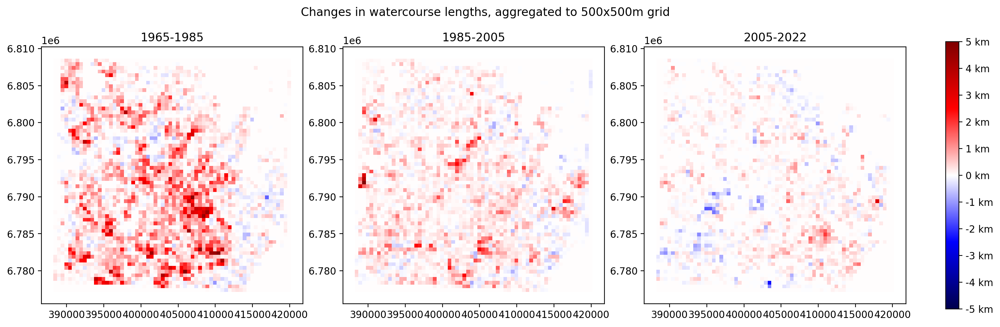

In [ ]:
import matplotlib.colors as colors

fig, axs = plt.subplots(1,4, figsize=(17,5), dpi=200, gridspec_kw={'width_ratios': [1,1,1,0.05]})
grid.plot(column='watercourse_change_6585', ax=axs[0], vmin=-5, vmax=5, cmap='seismic')
grid.plot(column='watercourse_change_8505', ax=axs[1], vmin=-5, vmax=5, cmap='seismic')
grid.plot(column='watercourse_change_0522', ax=axs[2], vmin=-5, vmax=5, cmap='seismic')
axs[0].set_title('1965-1985')
axs[1].set_title('1985-2005')
axs[2].set_title('2005-2022')

norm = colors.Normalize(vmin=-5,vmax=5)
sm = plt.cm.ScalarMappable(cmap='seismic', norm=norm)
ticks = [-5,-4,-3,-2,-1,0,1,2,3,4,5]
cbar = plt.colorbar(sm, cax=axs[3], ticks=ticks)
cbar.ax.set_yticklabels([f'{t} km' for t in ticks])
plt.suptitle('Changes in watercourse lengths, aggregated to 500x500m grid')
plt.show()

Visualize the locations where there has been the most decrease in watercourse length between 1965 and 1985.

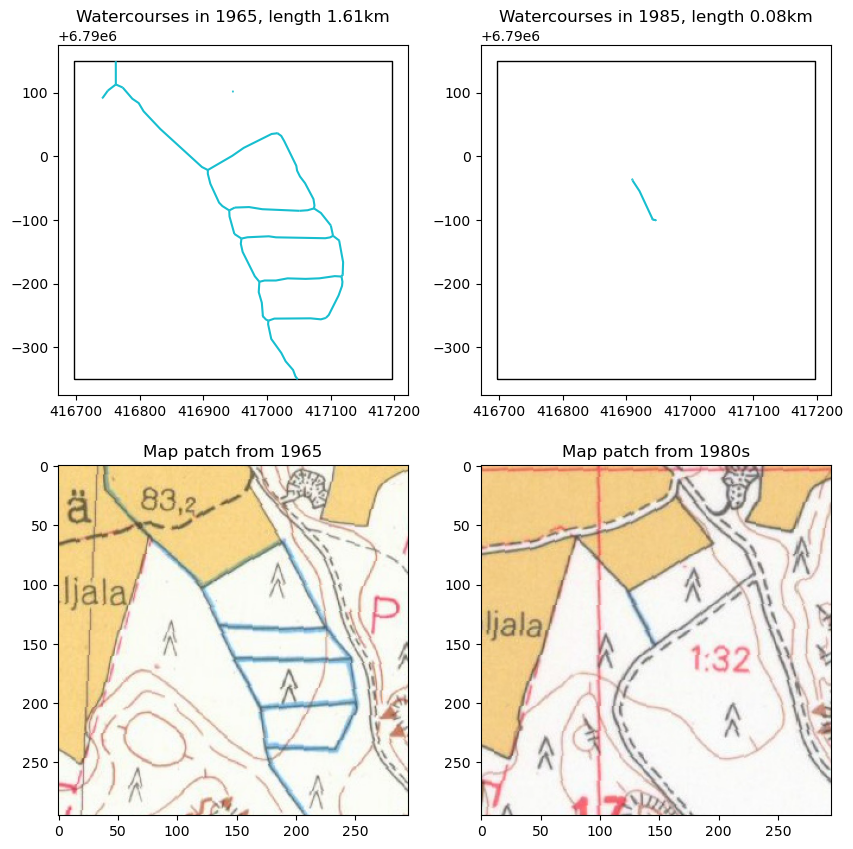

In [ ]:
wwloss_65 = grid[grid.watercourse_change_6585 == grid.watercourse_change_6585.min()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.watercourse_change_6585 == grid.watercourse_change_6585.min()].plot(ax=axs[0,0], facecolor='none')
watercourses_65.clip(wwloss_65).plot(ax=axs[0,0], color='tab:cyan')
axs[0,0].set_title(f'Watercourses in 1965, length {watercourses_65.clip(wwloss_65).length.sum() * 10**-3:.2f}km')
grid[grid.watercourse_change_6585 == grid.watercourse_change_6585.min()].plot(ax=axs[0,1], facecolor='none')
watercourses_80s.clip(wwloss_65).plot(ax=axs[0,1], color='tab:cyan')
axs[0,1].set_title(f'Watercourses in 1985, length {watercourses_80s.clip(wwloss_65).length.sum() * 10**-3:.2f}km')

img = get_map_patch(wwloss_65, 1965, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1965')

img = get_map_patch(wwloss_65, 1985, map_path)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Map patch from 1980s')
plt.show()

Same for 1985 and 2005

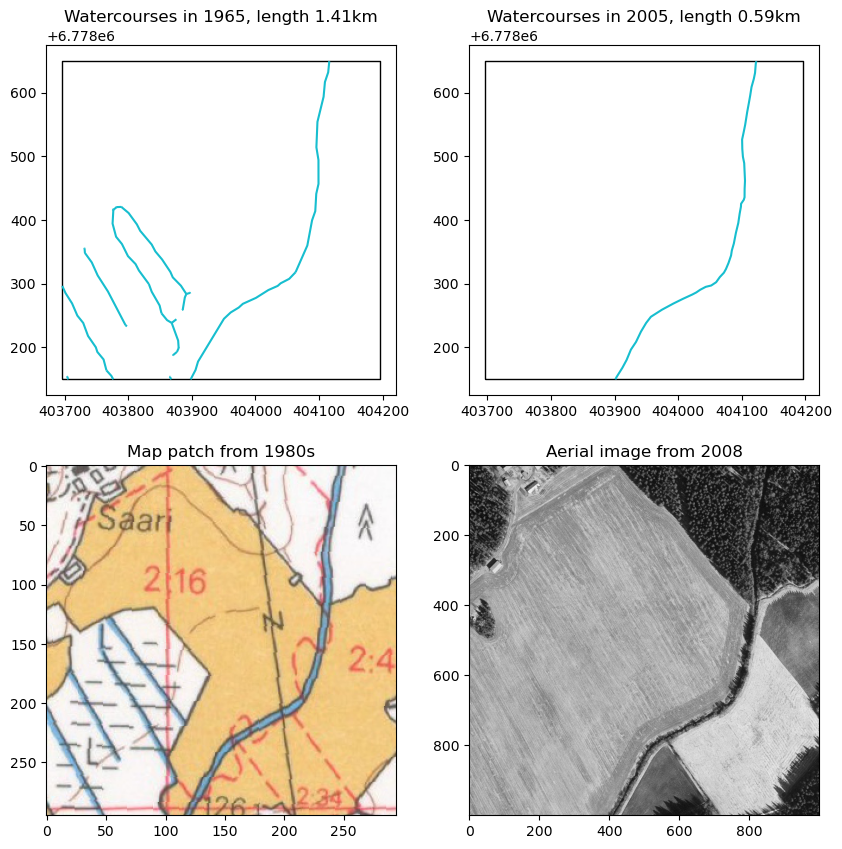

In [ ]:
wwloss_85 = grid[grid.watercourse_change_8505 == grid.watercourse_change_8505.min()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.watercourse_change_8505 == grid.watercourse_change_8505.min()].plot(ax=axs[0,0], facecolor='none')
watercourses_80s.clip(wwloss_85).plot(ax=axs[0,0], color='tab:cyan')
axs[0,0].set_title(f'Watercourses in 1965, length {watercourses_80s.clip(wwloss_85).length.sum() * 10**-3:.2f}km')

grid[grid.watercourse_change_8505 == grid.watercourse_change_8505.min()].plot(ax=axs[0,1], facecolor='none')
watercourses_05.clip(wwloss_85).plot(ax=axs[0,1], color='tab:cyan')
axs[0,1].set_title(f'Watercourses in 2005, length {watercourses_05.clip(wwloss_85).length.sum() * 10**-3:.2f}km')

img = get_map_patch(wwloss_85, 1985, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1980s')

img, year = get_wcs_img(wwloss_85.bounds, 2005)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Aerial image from {year}')
plt.show()

plt.show()

And then same visualizations for watercourse lenght increase.

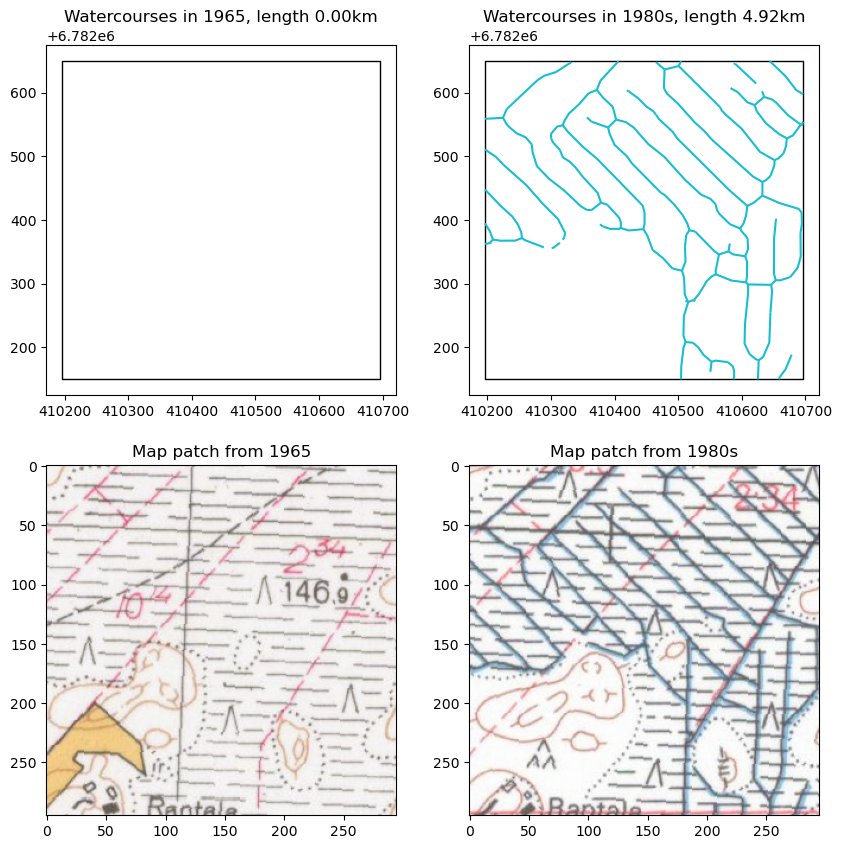

In [ ]:
wwgain_65 = grid[grid.watercourse_change_6585 == grid.watercourse_change_6585.max()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.watercourse_change_6585 == grid.watercourse_change_6585.max()].plot(ax=axs[0,0], facecolor='none')
watercourses_65.clip(wwgain_65).plot(ax=axs[0,0], color='tab:cyan')
axs[0,0].set_title(f'Watercourses in 1965, length {watercourses_65.clip(wwgain_65).length.sum() * 10**-3:.2f}km')
grid[grid.watercourse_change_6585 == grid.watercourse_change_6585.max()].plot(ax=axs[0,1], facecolor='none')
watercourses_80s.clip(wwgain_65).plot(ax=axs[0,1], color='tab:cyan')
axs[0,1].set_title(f'Watercourses in 1980s, length {watercourses_80s.clip(wwgain_65).length.sum() * 10**-3:.2f}km')

img = get_map_patch(wwgain_65, 1965, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1965')

img = get_map_patch(wwgain_65, 1985, map_path)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Map patch from 1980s')
plt.show()

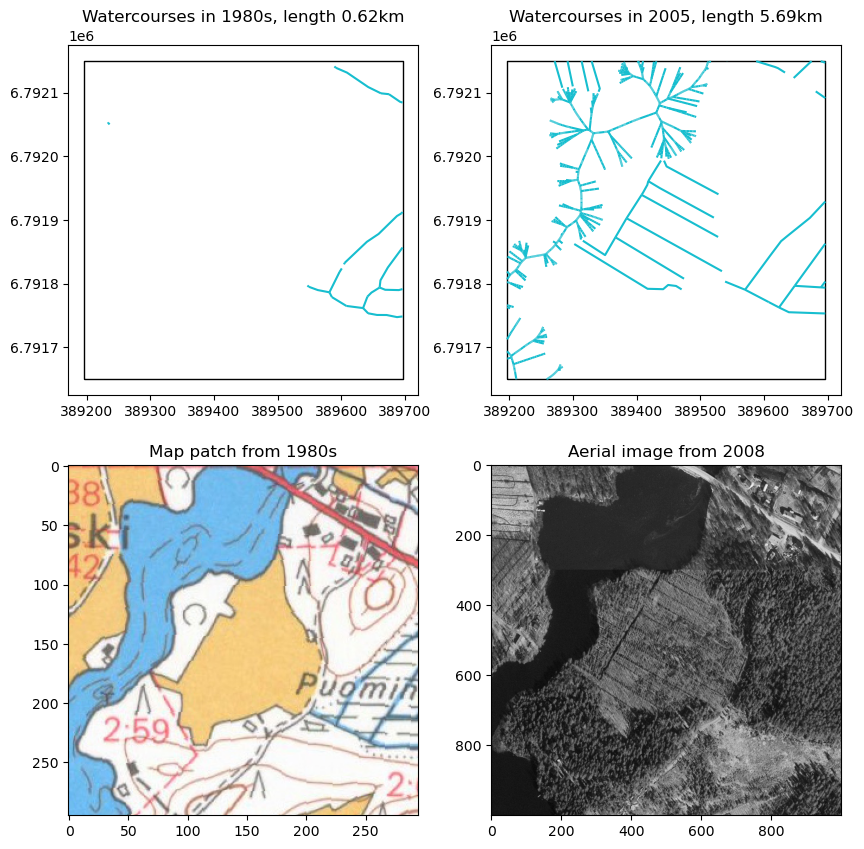

In [ ]:
wwgain_85 = grid[grid.watercourse_change_8505 == grid.watercourse_change_8505.max()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.watercourse_change_8505 == grid.watercourse_change_8505.max()].plot(ax=axs[0,0], facecolor='none')
watercourses_80s.clip(wwgain_85).plot(ax=axs[0,0], color='tab:cyan')
axs[0,0].set_title(f'Watercourses in 1980s, length {watercourses_80s.clip(wwgain_85).length.sum() * 10**-3:.2f}km')
grid[grid.watercourse_change_8505 == grid.watercourse_change_8505.max()].plot(ax=axs[0,1], facecolor='none')
watercourses_05.clip(wwgain_85).plot(ax=axs[0,1], color='tab:cyan')
axs[0,1].set_title(f'Watercourses in 2005, length {watercourses_05.clip(wwgain_85).length.sum() * 10**-3:.2f}km')

img = get_map_patch(wwgain_85, 1985, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1980s')

img, year = get_wcs_img(wwgain_85.bounds, 2005)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Aerial image from {year}')
plt.show()

plt.show()

The example above shows the difficulty of distinguishing between water bodies and watercourses, and how converting some watercourses into line geometries may fail. See a better example with the fifth highest.

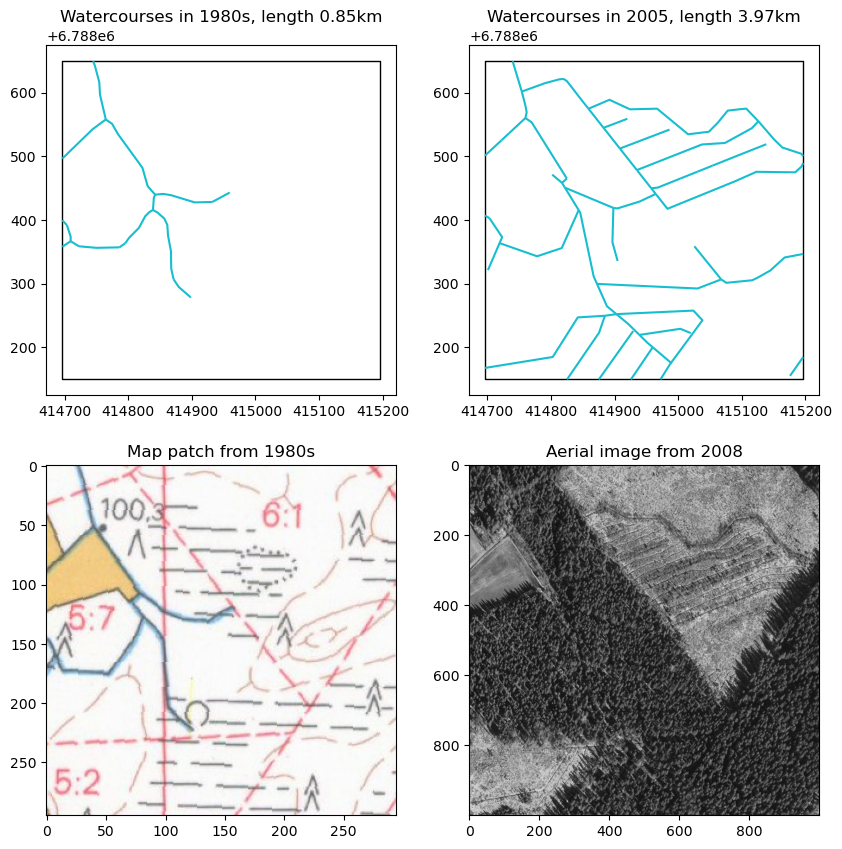

In [ ]:
wwgain_85 = grid[grid.watercourse_change_8505 == np.partition(grid.watercourse_change_8505.values, -5)[-5]].geometry.iloc[0]
fig, axs = plt.subplots(2,2, figsize=(10,10))
grid[grid.watercourse_change_8505 == np.partition(grid.watercourse_change_8505.values, -5)[-5]].plot(ax=axs[0,0], facecolor='none')
watercourses_80s.clip(wwgain_85).plot(ax=axs[0,0], color='tab:cyan')
axs[0,0].set_title(f'Watercourses in 1980s, length {watercourses_80s.clip(wwgain_85).length.sum() * 10**-3:.2f}km')
grid[grid.watercourse_change_8505 == np.partition(grid.watercourse_change_8505.values, -5)[-5]].plot(ax=axs[0,1], facecolor='none')
watercourses_05.clip(wwgain_85).plot(ax=axs[0,1], color='tab:cyan')
axs[0,1].set_title(f'Watercourses in 2005, length {watercourses_05.clip(wwgain_85).length.sum() * 10**-3:.2f}km')

img = get_map_patch(wwgain_85, 1985, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1980s')

img, year = get_wcs_img(wwgain_85.bounds, 2005)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Aerial image from {year}')
plt.show()

plt.show()

### Mire-watercourse -combinations

Instead of rectangular grid, the watercourse change indicating ditching or restoration can be visualized for mires area. In this example, we use the mire layer from 1965 maps as the aggregation layer.

In [ ]:
#|output: false

mires_65['drainage_len_65'] = mires_65.progress_apply(lambda row: get_len(row, watercourses_65, watercourses_65.sindex), axis=1)
mires_65['drainage_len_85'] = mires_65.progress_apply(lambda row: get_len(row, watercourses_80s, watercourses_80s.sindex), axis=1)
mires_65['drainage_len_05'] = mires_65.progress_apply(lambda row: get_len(row, watercourses_05, watercourses_05.sindex), axis=1)
mires_65['drainage_len_22'] = mires_65.progress_apply(lambda row: get_len(row, watercourses_22, watercourses_22.sindex), axis=1)

 93%|███████████████████████████████████████████████████████████████████████▊     | 6968/7477 [00:44<01:02,  8.14it/s]

In [ ]:
mires_65['drain_change_6585'] = (mires_65.drainage_len_85 - mires_65.drainage_len_65)
mires_65['drain_change_8505'] = (mires_65.drainage_len_05 - mires_65.drainage_len_85)
mires_65['drain_change_0522'] = (mires_65.drainage_len_22 - mires_65.drainage_len_05)

Filter out the mire where the ditching has been the most aggressive between 1965 and 1985.

In [ ]:
largest_mire = mires_65[mires_65.drain_change_6585 == mires_65.drain_change_6585.max()].geometry.iloc[0]
fig, axs = plt.subplots(2,2, dpi=200, figsize=(10,10))
mires_65.clip(largest_mire).plot(ax=axs[0,0], facecolor='none')
mires_80s.clip(largest_mire).plot(ax=axs[0,1], facecolor='none')
mires_05.clip(largest_mire).plot(ax=axs[1,0], facecolor='none')
mires_22.clip(largest_mire).plot(ax=axs[1,1], facecolor='none')

watercourses_65.clip(largest_mire).plot(ax=axs[0,0])
watercourses_80s.clip(largest_mire).plot(ax=axs[0,1])
watercourses_05.clip(largest_mire).plot(ax=axs[1,0])
watercourses_22.clip(largest_mire).plot(ax=axs[1,1])

axs[0,0].set_title(f'Watercourses in 1965, {watercourses_65.clip(largest_mire).length.sum()*10**-3:.2f} km')
axs[0,1].set_title(f'Watercourses in 1985, {watercourses_80s.clip(largest_mire).length.sum()*10**-3:.2f} km')
axs[1,0].set_title(f'Watercourses in 2005, {watercourses_05.clip(largest_mire).length.sum()*10**-3:.2f} km')
axs[1,1].set_title(f'Watercourses in 2022, {watercourses_22.clip(largest_mire).length.sum()*10**-3:.2f} km')

plt.tight_layout()

Same area as map patches and aerial images.

In [ ]:
fig, axs = plt.subplots(2,2, dpi=200, figsize=(10,10))
img = get_map_patch(box(*largest_mire.bounds), 1965, map_path)
for a in axs.flatten(): a.axis('off')
axs[0,0].imshow(img, cmap='gray')
axs[0,0].set_title(f'Map patch from 1965')

img = get_map_patch(box(*largest_mire.bounds), 1985, map_path)
axs[0,1].imshow(img, cmap='gray')
axs[0,1].set_title(f'Map patch from 1980s')


# WCS only supports 2x2km images so need to get creative
midx = (largest_mire.bounds[2] - largest_mire.bounds[0]) / 2
midy = (largest_mire.bounds[3] - largest_mire.bounds[1]) / 2
botl,_ = get_wcs_img((largest_mire.bounds[0], 
                      largest_mire.bounds[1], 
                      largest_mire.bounds[2]-midx, 
                      largest_mire.bounds[3]-midy), 2005)
botr,_ = get_wcs_img((largest_mire.bounds[2]-midx, 
                      largest_mire.bounds[1], 
                      largest_mire.bounds[2], 
                      largest_mire.bounds[3]-midy), 2005)
topl,_ = get_wcs_img((largest_mire.bounds[0], 
                      largest_mire.bounds[3]-midy, 
                      largest_mire.bounds[2]-midx, 
                      largest_mire.bounds[3]), 2005)
topr,year = get_wcs_img((largest_mire.bounds[2]-midx, 
                      largest_mire.bounds[3]-midy, 
                      largest_mire.bounds[2],
                      largest_mire.bounds[3]), 2005)
toprow = np.hstack((topl, topr))
botrow = np.hstack((botl, botr))
full = np.vstack((toprow, botrow))
axs[1,0].imshow(full, cmap='gray')
axs[1,0].set_title(f'Aerial image from {year}')

botl,_ = get_wcs_img((largest_mire.bounds[0], 
                      largest_mire.bounds[1], 
                      largest_mire.bounds[2]-midx, 
                      largest_mire.bounds[3]-midy), 2022)
botr,_ = get_wcs_img((largest_mire.bounds[2]-midx, 
                      largest_mire.bounds[1], 
                      largest_mire.bounds[2], 
                      largest_mire.bounds[3]-midy), 2022)
topl,_ = get_wcs_img((largest_mire.bounds[0], 
                      largest_mire.bounds[3]-midy, 
                      largest_mire.bounds[2]-midx, 
                      largest_mire.bounds[3]), 2022)
topr,year = get_wcs_img((largest_mire.bounds[2]-midx, 
                      largest_mire.bounds[3]-midy, 
                      largest_mire.bounds[2],
                      largest_mire.bounds[3]), 2022)
toprow = np.hstack((topl, topr))
botrow = np.hstack((botl, botr))
full = np.vstack((toprow, botrow))
axs[1,1].imshow(full, cmap='gray')
axs[1,1].set_title(f'Aerial image from {year}')
plt.show()

## Water bodies

Even though water bodies don't change that much, let's visualize them for completeness.

In [ ]:
for r in results:
    polygonize(respath/r, polypath/'waterbodies'/r.replace('tif', 'geojson'), target_class=5, scale_factor=1/2)

In [ ]:
waterbodies_65 = None
waterbodies_80s = None

for p in os.listdir(polypath/'waterbodies'):
    union_gdf = gpd.read_file(polypath/'waterbodies'/p)
    if '1965' in p:
        if waterbodies_65 is None: waterbodies_65 = union_gdf
        else: waterbodies_65 = pd.concat((waterbodies_65, union_gdf))
    else:
        if waterbodies_80s is None: waterbodies_80s = union_gdf
        else: waterbodies_80s = pd.concat((waterbodies_80s, union_gdf))
waterbodies_65.reset_index(inplace=True, drop=True)
waterbodies_80s.reset_index(inplace=True, drop=True)

waterbodies_05 = gpd.read_file(mtk_path/'2005/waterbodies.geojson')
waterbodies_22 = gpd.read_file(mtk_path/'2022/jarvet_2022.geojson')

In [ ]:
fig, axs = plt.subplots(2,2, figsize=(10,10), dpi=150)
waterbodies_65.plot(ax=axs[0,0], color='tab:blue')
axs[0,0].set_title(f'Water bodies 1965, total area {waterbodies_65.area.sum() * 10**-6:.2f} km²')
waterbodies_80s.plot(ax=axs[0,1], color='tab:blue')
axs[0,1].set_title(f'Water bodies 1984-1985 {waterbodies_80s.area.sum() * 10**-6:.2f} km²')
waterbodies_05.plot(ax=axs[1,0], color='tab:blue')
axs[1,0].set_title(f'Water bodies 2005 {waterbodies_05.area.sum() * 10**-6:.2f} km²')
waterbodies_22.plot(ax=axs[1,1], color='tab:blue')
axs[1,1].set_title(f'Water bodies 2022 {waterbodies_22.area.sum() * 10**-6:.2f} km²')
plt.tight_layout()

Some changes are due to model classifying wide rivers etc. as water bodies instead of watercourses.

In [ ]:
#|output: false

grid['waterbody_area_65'] = grid.progress_apply(lambda cell: get_field_area(cell, waterbodies_65, waterbodies_65.sindex), axis=1)
grid['waterbody_area_85'] = grid.progress_apply(lambda cell: get_field_area(cell, waterbodies_80s, waterbodies_80s.sindex), axis=1)
grid['waterbody_area_05'] = grid.progress_apply(lambda cell: get_field_area(cell, waterbodies_05, waterbodies_05.sindex), axis=1)
grid['waterbody_area_22'] = grid.progress_apply(lambda cell: get_field_area(cell, waterbodies_22, waterbodies_22.sindex), axis=1)

## Collate largest changes into a single figure

Collate largest changes for each class into a single figure.

In [ ]:
grid['field_change_6522'] = np.abs(grid.field_area_22 - grid.field_area_65)
grid['mire_change_6522'] = np.abs(grid.mire_area_22 - grid.mire_area_65)
grid['road_change_6522'] = np.abs(grid.road_length_22 - grid.road_length_65)
grid['watercourse_change_6522'] = np.abs(grid.watercourse_length_22 - grid.watercourse_length_65)
grid['waterbody_change_6522'] = np.abs(grid.waterbody_area_22 - grid.waterbody_area_65)

In [ ]:
fig, axs = plt.subplots(5,4, dpi=150, figsize=(12,15))
#for a in axs.flatten(): a.axis('off')
    
fieldgain_22 = grid[grid.field_change_6522 == grid.field_change_6522.max()].geometry.iloc[0]
grid[grid.field_change_6522 == grid.field_change_6522.max()].plot(ax=axs[0,0], facecolor='none', color='white')
fields_65.clip(fieldgain_22).plot(ax=axs[0,0], color='tab:orange')
axs[0,0].set_title(f'Fields in 1965 ({fields_65.clip(fieldgain_22).area.sum() * 10**-4:.2f} ha)')
grid[grid.field_change_6522 == grid.field_change_6522.max()].plot(ax=axs[0,1], facecolor='none', color='white')
fields_80s.clip(fieldgain_22).plot(ax=axs[0,1], color='tab:orange')
axs[0,1].set_title(f'Fields in 1985 ({fields_80s.clip(fieldgain_22).area.sum() * 10**-4:.2f} ha)')
grid[grid.field_change_6522 == grid.field_change_6522.max()].plot(ax=axs[0,2], facecolor='none', color='white')
fields_05.clip(fieldgain_22).plot(ax=axs[0,2], color='tab:orange')
axs[0,2].set_title(f'Fields in 2005 ({fields_05.clip(fieldgain_22).area.sum() * 10**-4:.2f} ha)')
grid[grid.field_change_6522 == grid.field_change_6522.max()].plot(ax=axs[0,3], facecolor='none', color='white')
fields_22.clip(fieldgain_22).plot(ax=axs[0,3], color='tab:orange')
axs[0,3].set_title(f'Fields in 2022 ({fields_22.clip(fieldgain_22).area.sum() * 10**-4:.2f} ha)')

miregain_22 = grid[grid.mire_change_6522 == grid.mire_change_6522.max()].geometry.iloc[0]
grid[grid.mire_change_6522 == grid.mire_change_6522.max()].plot(ax=axs[1,0], facecolor='none', color='white')
mires_65.clip(miregain_22).plot(ax=axs[1,0], color='tab:gray')
axs[1,0].set_title(f'Mires in 1965 ({mires_65.clip(miregain_22).area.sum() * 10**-4:.2f} ha)')
grid[grid.mire_change_6522 == grid.mire_change_6522.max()].plot(ax=axs[1,1], facecolor='none', color='white')
mires_80s.clip(miregain_22).plot(ax=axs[1,1], color='tab:gray')
axs[1,1].set_title(f'Mires in 1985 ({mires_80s.clip(miregain_22).area.sum() * 10**-4:.2f} ha)')
grid[grid.mire_change_6522 == grid.mire_change_6522.max()].plot(ax=axs[1,2], facecolor='none', color='white')
mires_05.clip(miregain_22).plot(ax=axs[1,2], color='tab:gray')
axs[1,2].set_title(f'Mires in 2005 ({mires_05.clip(miregain_22).area.sum() * 10**-4:.2f} ha)')
grid[grid.mire_change_6522 == grid.mire_change_6522.max()].plot(ax=axs[1,3], facecolor='none', color='white')
mires_22.clip(miregain_22).plot(ax=axs[1,3], color='tab:gray')
axs[1,3].set_title(f'Mires in 2022 ({mires_22.clip(miregain_22).area.sum() * 10**-4:.2f} ha)')

roadgain_22 = grid[grid.road_change_6522 == grid.road_change_6522.max()].geometry.iloc[0]
grid[grid.road_change_6522 == grid.road_change_6522.max()].plot(ax=axs[2,0], facecolor='none', color='white')
roads_65.clip(roadgain_22).plot(ax=axs[2,0], color='tab:red')
axs[2,0].set_title(f'Roads in 1965 ({roads_65.clip(roadgain_22).length.sum() * 10**-3:.2f} km)')
grid[grid.road_change_6522 == grid.road_change_6522.max()].plot(ax=axs[2,1], facecolor='none', color='white')
roads_80s.clip(roadgain_22).plot(ax=axs[2,1], color='tab:red')
axs[2,1].set_title(f'Roads in 1985 ({roads_80s.clip(roadgain_22).length.sum() * 10**-3:.2f} km)')
grid[grid.road_change_6522 == grid.road_change_6522.max()].plot(ax=axs[2,2], facecolor='none', color='white')
roads_05.clip(roadgain_22).plot(ax=axs[2,2], color='tab:red')
axs[2,2].set_title(f'Roads in 2005 ({roads_05.clip(roadgain_22).length.sum() * 10**-3:.2f} km)')
grid[grid.road_change_6522 == grid.road_change_6522.max()].plot(ax=axs[2,3], facecolor='none', color='white')
roads_22.clip(roadgain_22).plot(ax=axs[2,3], color='tab:red')
axs[2,3].set_title(f'Roads in 2022 ({roads_22.clip(roadgain_22).length.sum() * 10**-3:.2f} km)')

wwchange = np.partition(grid.watercourse_change_6522.values, -2)[-2]
watercoursegain_22 = grid[grid.watercourse_change_6522 == wwchange].geometry.iloc[0]
grid[grid.watercourse_change_6522 == wwchange].plot(ax=axs[3,0], facecolor='none', color='white')
watercourses_65.clip(watercoursegain_22).plot(ax=axs[3,0], color='tab:cyan')
axs[3,0].set_title(f'Watercourses in 1965 ({watercourses_65.clip(watercoursegain_22).length.sum() * 10**-3:.2f} km)')
grid[grid.watercourse_change_6522 == wwchange].plot(ax=axs[3,1], facecolor='none', color='white')
watercourses_80s.clip(watercoursegain_22).plot(ax=axs[3,1], color='tab:cyan')
axs[3,1].set_title(f'Watercourses in 1985 ({watercourses_80s.clip(watercoursegain_22).length.sum() * 10**-3:.2f} km)')
grid[grid.watercourse_change_6522 == wwchange].plot(ax=axs[3,2], facecolor='none', color='white')
watercourses_05.clip(watercoursegain_22).plot(ax=axs[3,2], color='tab:cyan')
axs[3,2].set_title(f'Watercourses in 2005 ({watercourses_05.clip(watercoursegain_22).length.sum() * 10**-3:.2f} km)')
grid[grid.watercourse_change_6522 == wwchange].plot(ax=axs[3,3], facecolor='none', color='white')
watercourses_22.clip(watercoursegain_22).plot(ax=axs[3,3], color='tab:cyan')
axs[3,3].set_title(f'Watercourses in 2022 ({watercourses_22.clip(watercoursegain_22).length.sum() * 10**-3:.2f} km)')

waterbodygain_22 = grid[grid.waterbody_change_6522 == grid.waterbody_change_6522.max()].geometry.iloc[0]
grid[grid.waterbody_change_6522 == grid.waterbody_change_6522.max()].plot(ax=axs[4,0], facecolor='none', color='white')
waterbodies_65.clip(waterbodygain_22).plot(ax=axs[4,0], color='tab:blue')
axs[4,0].set_title(f'Water bodies in 1965 ({waterbodies_65.clip(waterbodygain_22).area.sum() * 10**-4:.2f} ha)')
grid[grid.waterbody_change_6522 == grid.waterbody_change_6522.max()].plot(ax=axs[4,1], facecolor='none', color='white')
waterbodies_80s.clip(waterbodygain_22).plot(ax=axs[4,1], color='tab:blue')
axs[4,1].set_title(f'Water bodies in 1985 ({waterbodies_80s.clip(waterbodygain_22).area.sum() * 10**-4:.2f} ha)')
grid[grid.waterbody_change_6522 == grid.waterbody_change_6522.max()].plot(ax=axs[4,2], facecolor='none', color='white')
waterbodies_05.clip(waterbodygain_22).plot(ax=axs[4,2], color='tab:blue')
axs[4,2].set_title(f'Water bodies in 2005 ({waterbodies_05.clip(waterbodygain_22).area.sum() * 10**-4:.2f} ha)')
grid[grid.waterbody_change_6522 == grid.waterbody_change_6522.max()].plot(ax=axs[4,3], facecolor='none', color='white')
waterbodies_22.clip(waterbodygain_22).plot(ax=axs[4,3], color='tab:blue')
axs[4,3].set_title(f'Water bodies in 2022 ({waterbodies_22.clip(waterbodygain_22).area.sum() * 10**-4:.2f} ha)')
 
plt.tight_layout()

plt.savefig('../data/figures/extremechanges.jpeg', dpi=300)
plt.show()

See the map patches and locations for the same locations.

In [ ]:
fig, axs = plt.subplots(5,4, dpi=150, figsize=(12,15))
for a in axs.flatten(): a.axis('off')
    
fieldgain_22 = grid[grid.field_change_6522 == grid.field_change_6522.max()].geometry.iloc[0]
img = get_map_patch(fieldgain_22, 1965, map_path)
axs[0,0].imshow(img, cmap='gray')
axs[0,0].set_title(f'Map patch from 1965')

img = get_map_patch(fieldgain_22, 1985, map_path)
axs[0,1].imshow(img, cmap='gray')
axs[0,1].set_title(f'Map patch from 1980s')

img, year = get_wcs_img(fieldgain_22.bounds, 2005)
axs[0,2].imshow(img, cmap='gray')
axs[0,2].set_title(f'Aerial image from {year}')

img, year = get_wcs_img(fieldgain_22.bounds, 2022)
axs[0,3].imshow(img, cmap='gray')
axs[0,3].set_title(f'Aerial image from {year}')

miregain_22 = grid[grid.mire_change_6522 == grid.mire_change_6522.max()].geometry.iloc[0]
img = get_map_patch(miregain_22, 1965, map_path)
axs[1,0].imshow(img, cmap='gray')
axs[1,0].set_title(f'Map patch from 1965')

img = get_map_patch(miregain_22, 1985, map_path)
axs[1,1].imshow(img, cmap='gray')
axs[1,1].set_title(f'Map patch from 1980s')

img, year = get_wcs_img(miregain_22.bounds, 2005)
axs[1,2].imshow(img, cmap='gray')
axs[1,2].set_title(f'Aerial image from {year}')

img, year = get_wcs_img(miregain_22.bounds, 2022)
axs[1,3].imshow(img, cmap='gray')
axs[1,3].set_title(f'Aerial image from {year}')

roadgain_22 = grid[grid.road_change_6522 == grid.road_change_6522.max()].geometry.iloc[0]
img = get_map_patch(roadgain_22, 1965, map_path)
axs[2,0].imshow(img, cmap='gray')
axs[2,0].set_title(f'Map patch from 1965')

img = get_map_patch(roadgain_22, 1985, map_path)
axs[2,1].imshow(img, cmap='gray')
axs[2,1].set_title(f'Map patch from 1980s')

img, year = get_wcs_img(roadgain_22.bounds, 2005)
axs[2,2].imshow(img, cmap='gray')
axs[2,2].set_title(f'Aerial image from {year}')

img, year = get_wcs_img(roadgain_22.bounds, 2022)
axs[2,3].imshow(img, cmap='gray')
axs[2,3].set_title(f'Aerial image from {year}')

wwchange = np.partition(grid.watercourse_change_6522.values, -2)[-2]
watercoursegain_22 = grid[grid.watercourse_change_6522 == wwchange].geometry.iloc[0]
img = get_map_patch(watercoursegain_22, 1965, map_path)
axs[3,0].imshow(img, cmap='gray')
axs[3,0].set_title(f'Map patch from 1965')

img = get_map_patch(watercoursegain_22, 1985, map_path)
axs[3,1].imshow(img, cmap='gray')
axs[3,1].set_title(f'Map patch from 1980s')

img, year = get_wcs_img(watercoursegain_22.bounds, 2005)
axs[3,2].imshow(img, cmap='gray')
axs[3,2].set_title(f'Aerial image from {year}')

img, year = get_wcs_img(watercoursegain_22.bounds, 2022)
axs[3,3].imshow(img, cmap='gray')
axs[3,3].set_title(f'Aerial image from {year}')

waterbodygain_22 = grid[grid.waterbody_change_6522 == grid.waterbody_change_6522.max()].geometry.iloc[0]

img = get_map_patch(waterbodygain_22, 1965, map_path)
axs[4,0].imshow(img, cmap='gray')
axs[4,0].set_title(f'Map patch from 1965')

img = get_map_patch(waterbodygain_22, 1985, map_path)
axs[4,1].imshow(img, cmap='gray')
axs[4,1].set_title(f'Map patch from 1980s')

img, year = get_wcs_img(waterbodygain_22.bounds, 2005)
axs[4,2].imshow(img, cmap='gray')
axs[4,2].set_title(f'Aerial image from {year}')

img, year = get_wcs_img(waterbodygain_22.bounds, 2022)
axs[4,3].imshow(img, cmap='gray')
axs[4,3].set_title(f'Aerial image from {year}')
plt.tight_layout()
plt.show()